In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
import seaborn as sns

In [2]:
x = pd.read_csv('./dengue_features_train.csv')
y = pd.read_csv('./dengue_labels_train.csv')

In [3]:
#merging training features and labels
merged_df = pd.merge(x, y, on=['city', 'year', 'weekofyear'])
merged_df

,city,year,weekofyear,week_start_date,ndvi_ne,ndvi_nw,ndvi_se,ndvi_sw,precipitation_amt_mm,reanalysis_air_temp_k,...,reanalysis_relative_humidity_percent,reanalysis_sat_precip_amt_mm,reanalysis_specific_humidity_g_per_kg,reanalysis_tdtr_k,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
0,sj,1990,18,1990-04-30,0.122600,0.103725,0.198483,0.177617,12.42,297.572857,...,73.365714,12.42,14.012857,2.628571,25.442857,6.900000,29.4,20.0,16.0,4
1,sj,1990,19,1990-05-07,0.169900,0.142175,0.162357,0.155486,22.82,298.211429,...,77.368571,22.82,15.372857,2.371429,26.714286,6.371429,31.7,22.2,8.6,5
2,sj,1990,20,1990-05-14,0.032250,0.172967,0.157200,0.170843,34.54,298.781429,...,82.052857,34.54,16.848571,2.300000,26.714286,6.485714,32.2,22.8,41.4,4
3,sj,1990,21,1990-05-21,0.128633,0.245067,0.227557,0.235886,15.36,298.987143,...,80.337143,15.36,16.672857,2.428571,27.471429,6.771429,33.3,23.3,4.0,3
4,sj,1990,22,1990-05-28,0.196200,0.262200,0.251200,0.247340,7.52,299.518571,...,80.460000,7.52,17.210000,3.014286,28.942857,9.371429,35.0,23.9,5.8,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1451,iq,2010,21,2010-05-28,0.342750,0.318900,0.256343,0.292514,55.30,299.334286,...,88.765714,55.30,18.485714,9.800000,28.633333,11.933333,35.4,22.4,27.0,5
1452,iq,2010,22,2010-06-04,0.160157,0.160371,0.136043,0.225657,86.47,298.330000,...,91.600000,86.47,18.070000,7.471429,27.433333,10.500000,34.7,21.7,36.6,8
1453,iq,2010,23,2010-06-11,0.247057,0.146057,0.250357,0.233714,58.94,296.598571,...,94.280000,58.94,17.008571,7.500000,24.400000,6.900000,32.2,19.2,7.4,1
1454,iq,2010,24,2010-06-18,0.333914,0.245771,0.278886,0.325486,59.67,296.345714,...,94.660000,59.67,16.815714,7.871429,25.433333,8.733333,31.2,21.0,16.0,1


In [4]:
df = pd.DataFrame(merged_df)
df.shape


(1456, 25)

<b>Let's start with checking if the cities have different distributions for their variables. For this part, we'll check the means of the variables and conduct a t-test.</b> <br>
H0 = There is no difference between the data for San Juan and Iquitos<br>
H1 = There is some difference between the data for San Juan and Iquitos<br>

In [5]:
from scipy.stats import ttest_ind

# Let's divide the model into San Juan and Iquitos
df_sj = df[df['city']=='sj']
df_iq = df[df['city']=='iq']

# Filter out only numeric columns for each city
df_sj_numeric = df_sj.select_dtypes(include=['float64', 'int64'])
df_iq_numeric = df_iq.select_dtypes(include=['float64', 'int64'])

# Calculate means for both cities' data
sj_means = df_sj_numeric.mean()
iq_means = df_iq_numeric.mean()

t_test_p_values = {}

# Perform t-test for each numerical column
for column in df_sj_numeric.columns:
    stat, p = ttest_ind(df_sj_numeric[column].dropna(), df_iq_numeric[column].dropna(), equal_var=False)
    t_test_p_values[column] = p

# Combine the results into a DataFrame for better visualization
mean_comparison_df = pd.DataFrame({'SJ_Mean': sj_means, 'IQ_Mean': iq_means, 'P_Value': t_test_p_values})
mean_comparison_df


,SJ_Mean,IQ_Mean,P_Value
year,1998.826923,2005.000000,4.608182e-146
weekofyear,26.503205,26.503846,9.993778e-01
ndvi_ne,0.057925,0.263869,1.511866e-216
ndvi_nw,0.067469,0.238783,2.870737e-205
ndvi_se,0.177655,0.250126,4.615870e-65
ndvi_sw,0.165956,0.266779,1.504697e-94
precipitation_amt_mm,35.470809,64.245736,7.168274e-39
reanalysis_air_temp_k,299.163653,297.869538,1.478583e-74
reanalysis_avg_temp_k,299.276920,299.133043,4.287780e-02
reanalysis_dew_point_temp_k,295.109519,295.492982,2.394511e-06


We can see here that almost all the means for the datasets are signficantly different. Hence, we fail to reject H1. 
Keeping this in mind, we're separating the models for the dengue data to accurately reflect the different requirements of each city.

<h1>San Juan Analysis</h1>

<h2> Missing Values and Imputation </h2>

In [6]:
# Check for missing values

missing_data = df_sj.isnull().sum()

#Calculate percentage of missing data to total data
total_data = len(df_sj)
missing_percentage = (missing_data / total_data) * 100
print(missing_percentage)

city                                      0.000000
year                                      0.000000
weekofyear                                0.000000
week_start_date                           0.000000
ndvi_ne                                  20.405983
ndvi_nw                                   5.235043
ndvi_se                                   2.029915
ndvi_sw                                   2.029915
precipitation_amt_mm                      0.961538
reanalysis_air_temp_k                     0.641026
reanalysis_avg_temp_k                     0.641026
reanalysis_dew_point_temp_k               0.641026
reanalysis_max_air_temp_k                 0.641026
reanalysis_min_air_temp_k                 0.641026
reanalysis_precip_amt_kg_per_m2           0.641026
reanalysis_relative_humidity_percent      0.641026
reanalysis_sat_precip_amt_mm              0.961538
reanalysis_specific_humidity_g_per_kg     0.641026
reanalysis_tdtr_k                         0.641026
station_avg_temp_c             

Most of the data has less than 5% missing values. For these data points, we will impute with the median value of the columns. We're using median because median is robust to skew in the data.

For ndvi_ne, we will do a regression analysis to replace the missing values.

In [7]:
# Let's start with replacing all the other columns with their column medians. 

df_sj = df[df['city'] == 'sj'].copy()

# Replace all the other columns' missing values with their column medians
for column in df_sj.columns:
    if column != 'ndvi_ne' and column != 'week_start_date' and column != 'city':
        median_value = df_sj[column].median()
        df_sj[column].fillna(median_value, inplace=True)
        

#Checking if it was done
missing_data = df_sj.isnull().sum()
print(missing_data)

city                                       0
year                                       0
weekofyear                                 0
week_start_date                            0
ndvi_ne                                  191
ndvi_nw                                    0
ndvi_se                                    0
ndvi_sw                                    0
precipitation_amt_mm                       0
reanalysis_air_temp_k                      0
reanalysis_avg_temp_k                      0
reanalysis_dew_point_temp_k                0
reanalysis_max_air_temp_k                  0
reanalysis_min_air_temp_k                  0
reanalysis_precip_amt_kg_per_m2            0
reanalysis_relative_humidity_percent       0
reanalysis_sat_precip_amt_mm               0
reanalysis_specific_humidity_g_per_kg      0
reanalysis_tdtr_k                          0
station_avg_temp_c                         0
station_diur_temp_rng_c                    0
station_max_temp_c                         0
station_mi

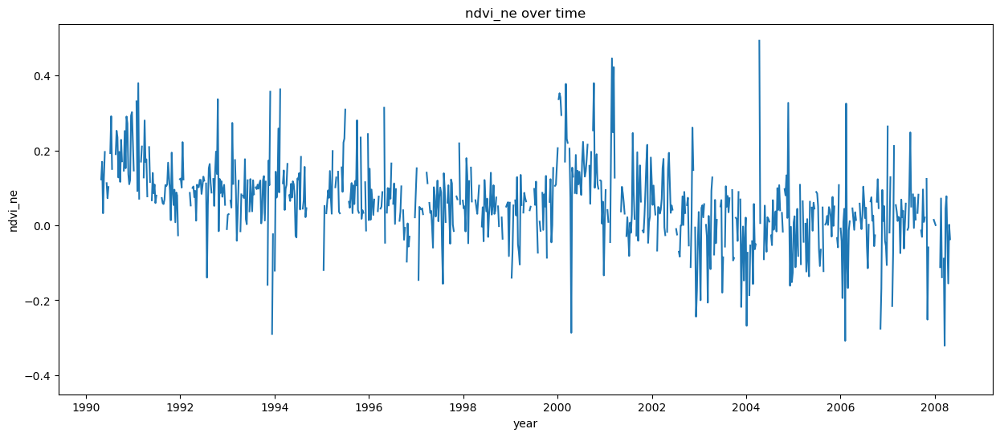

In [8]:

from datetime import datetime
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller

# Is the ndvi_ne temporally related? 
# Creating a new column 'date' combining 'year' and 'weekofyear' to create a datetime index
df_sj['date'] = df_sj.apply(lambda row: datetime.strptime(f"{int(row.year)}-{int(row.weekofyear)}-1", "%Y-%W-%w"), axis=1)

# Setting the new 'date' column as the index
df_sj.set_index('date', inplace=True)

# Sorting the DataFrame by the date index
df_sj.sort_index(inplace=True)

# Plotting total dengue cases over time
plt.figure(figsize=(15, 6))
plt.plot(df_sj['ndvi_ne'])
plt.title('ndvi_ne over time')
plt.xlabel('year')
plt.ylabel('ndvi_ne')
plt.show()

## There's a slight downward trend...but otherwise doesn't look strictly temporally related

In [9]:
# Now let's do a regression analysis for ndvi_ne
## To identify which features to include in the regression, I'll start with a simple correlation analysis 

correlation_matrix = df_sj.select_dtypes(include=['float64', 'int64']).corr()

ndvi_ne_correlations = correlation_matrix['ndvi_ne']

print(ndvi_ne_correlations)

year                                    -0.392312
weekofyear                              -0.020271
ndvi_ne                                  1.000000
ndvi_nw                                  0.669250
ndvi_se                                  0.234049
ndvi_sw                                  0.177792
precipitation_amt_mm                    -0.047435
reanalysis_air_temp_k                   -0.072853
reanalysis_avg_temp_k                   -0.070904
reanalysis_dew_point_temp_k             -0.040443
reanalysis_max_air_temp_k               -0.044448
reanalysis_min_air_temp_k               -0.096007
reanalysis_precip_amt_kg_per_m2          0.005275
reanalysis_relative_humidity_percent     0.038791
reanalysis_sat_precip_amt_mm            -0.047435
reanalysis_specific_humidity_g_per_kg   -0.035571
reanalysis_tdtr_k                       -0.008708
station_avg_temp_c                       0.063160
station_diur_temp_rng_c                  0.141960
station_max_temp_c                       0.091616


Looks like <b>year, ndvi_nw, ndvi_se, ndvi_sw and station_diur_temp_rng_c</b> have the strongest correlation with ndvi_ne 
We'll use these features to do the regression imputation for ndvi_ne

In [10]:
# Regression Imputation for ndvi_ne

from sklearn.linear_model import LinearRegression

# Set training and testing data

train_data = df_sj[df_sj['ndvi_ne'].notnull()]
test_data = df_sj[df_sj['ndvi_ne'].isnull()]

features = ['year', 'ndvi_nw', 'ndvi_se', 'ndvi_sw', 'station_diur_temp_rng_c']

model = LinearRegression()
model.fit(train_data[features], train_data['ndvi_ne'])

# Predict ndvi_ne for the rows where it's missing
df_sj.loc[df_sj['ndvi_ne'].isnull(), 'ndvi_ne'] = model.predict(test_data[features])

#Checking if it was done
missing_data = df_sj.isnull().sum()
print(missing_data)

city                                     0
year                                     0
weekofyear                               0
week_start_date                          0
ndvi_ne                                  0
ndvi_nw                                  0
ndvi_se                                  0
ndvi_sw                                  0
precipitation_amt_mm                     0
reanalysis_air_temp_k                    0
reanalysis_avg_temp_k                    0
reanalysis_dew_point_temp_k              0
reanalysis_max_air_temp_k                0
reanalysis_min_air_temp_k                0
reanalysis_precip_amt_kg_per_m2          0
reanalysis_relative_humidity_percent     0
reanalysis_sat_precip_amt_mm             0
reanalysis_specific_humidity_g_per_kg    0
reanalysis_tdtr_k                        0
station_avg_temp_c                       0
station_diur_temp_rng_c                  0
station_max_temp_c                       0
station_min_temp_c                       0
station_pre

<h2> Checking for Outliers </h2>

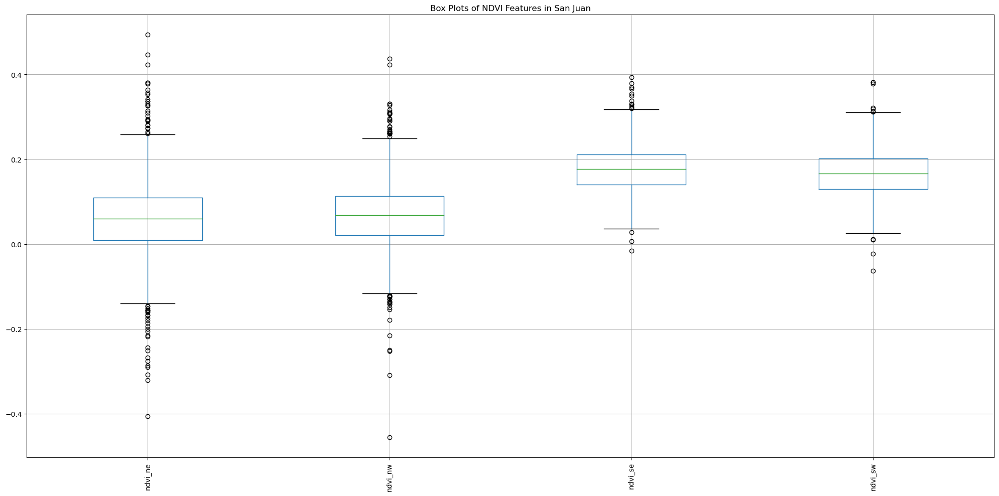

In [11]:
# Check for outliers

numerical_data = df_sj.select_dtypes(include=['float64', 'int64'])

# Remove columns that are not relevant for box plots
numerical_data = numerical_data.drop(columns=['year', 'weekofyear'])

#first plot ndvi data
ndvi_data = numerical_data[['ndvi_ne','ndvi_nw','ndvi_se','ndvi_sw']]

plt.figure(figsize=(20, 10))
ndvi_data.boxplot(rot=90)
plt.title('Box Plots of NDVI Features in San Juan')
plt.tight_layout()

plt.show()


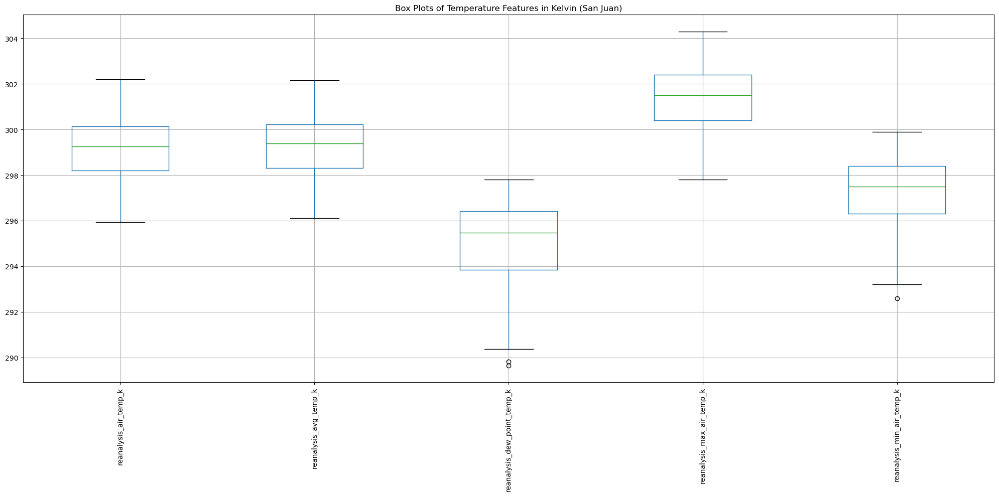

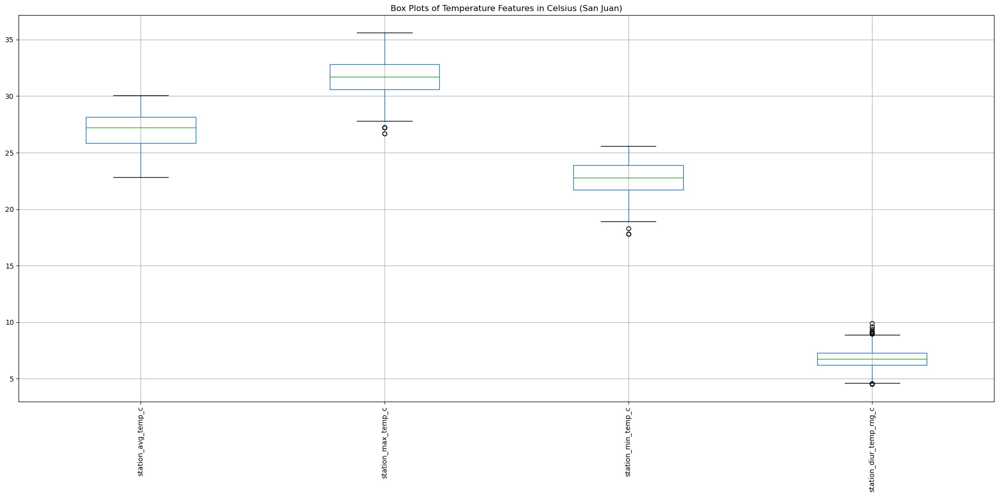

In [12]:
# Now check for outliers in the temperature data in San Juan
temp_data_k = numerical_data[['reanalysis_air_temp_k', 
    'reanalysis_avg_temp_k', 
    'reanalysis_dew_point_temp_k', 
    'reanalysis_max_air_temp_k', 
    'reanalysis_min_air_temp_k']]

plt.figure(figsize=(20, 10))
temp_data_k.boxplot(rot=90)
plt.title('Box Plots of Temperature Features in Kelvin (San Juan)')
plt.tight_layout()

plt.show()

temp_data_c = numerical_data[['station_avg_temp_c',
    'station_max_temp_c', 
    'station_min_temp_c','station_diur_temp_rng_c']]

plt.figure(figsize=(20, 10))
temp_data_c.boxplot(rot=90)
plt.title('Box Plots of Temperature Features in Celsius (San Juan)')
plt.tight_layout()


plt.show()

# tdtr = numerical_data['reanalysis_tdtr_k']
# tdtr.boxplot(rot=90)
# plt.title('Box Plot of TDTR in Kelvin (San Juan)')

# plt.show()


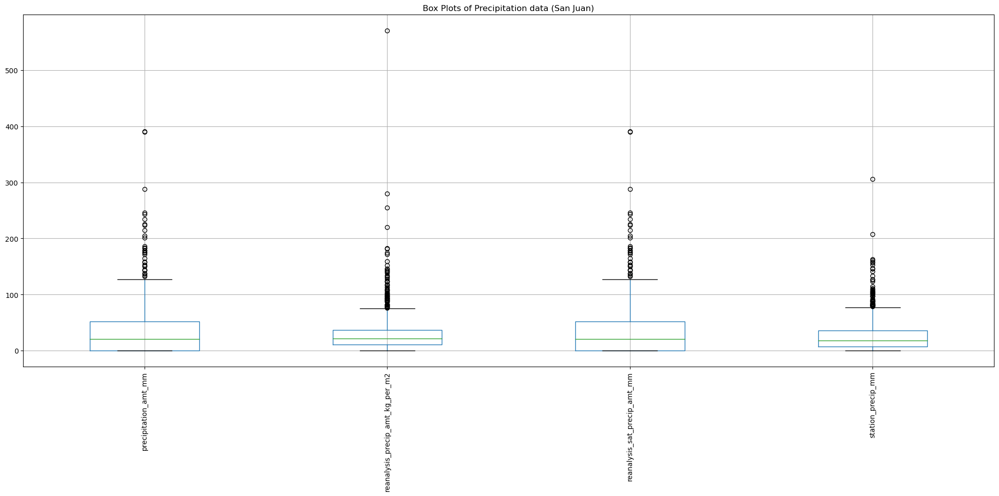

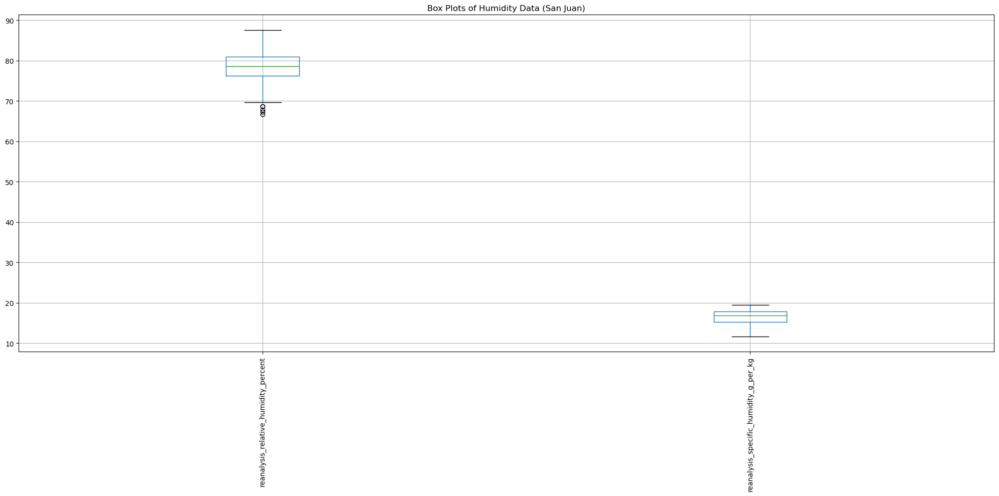

In [13]:
# Now check for outliers in the precipitation data in San Juan
temp_data_k = numerical_data[['precipitation_amt_mm', 
    'reanalysis_precip_amt_kg_per_m2', 
    'reanalysis_sat_precip_amt_mm','station_precip_mm']]

plt.figure(figsize=(20, 10))
temp_data_k.boxplot(rot=90)
plt.title('Box Plots of Precipitation data (San Juan)')
plt.tight_layout()

plt.show()

# Boxplots for Humidity data
temp_data_c = numerical_data[['reanalysis_relative_humidity_percent',
    'reanalysis_specific_humidity_g_per_kg']]

plt.figure(figsize=(20, 10))
temp_data_c.boxplot(rot=90)
plt.title('Box Plots of Humidity Data (San Juan)')
plt.tight_layout()

plt.show()

We see here that ndvi_ne and precipitation data have a lot of outliers. That's important to note when trying to understand how accurately our model can predict no. of cases.

<h2>Checking for Collinearity</h2>

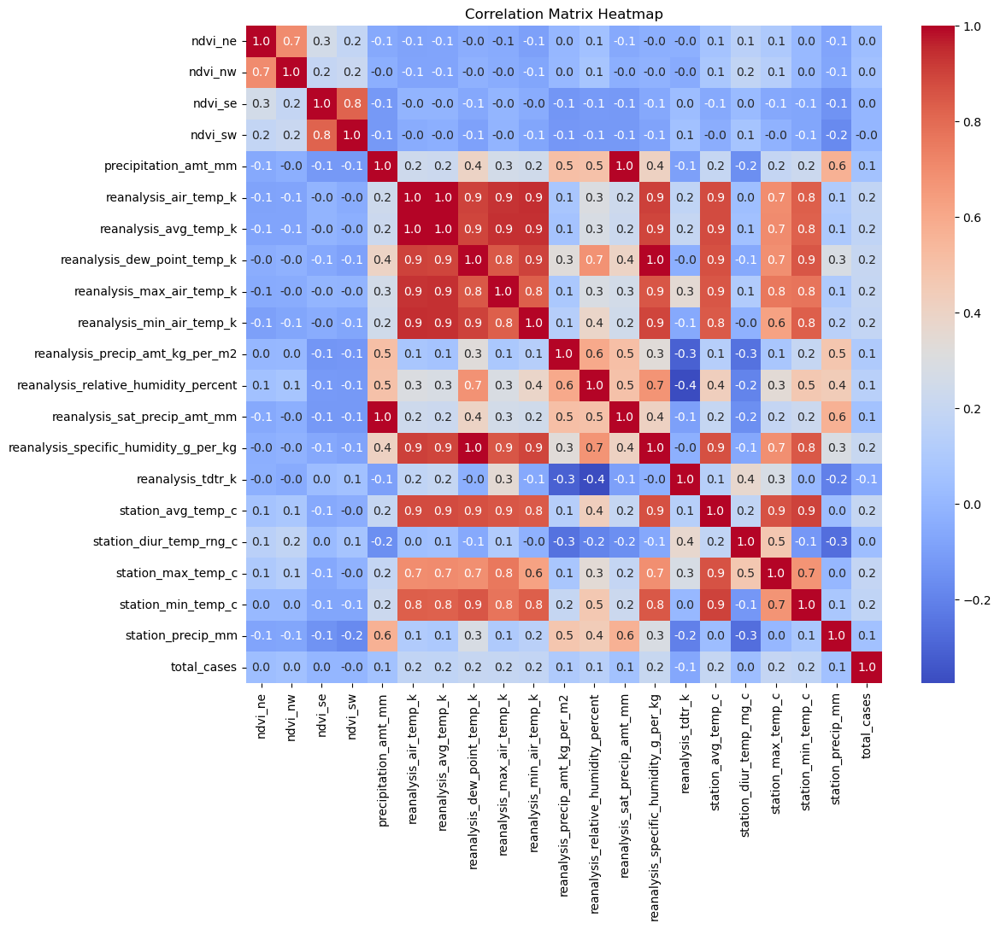

In [14]:
# Is there any collinearity between our data?

# Let's start with plotting a correlation map


corr_matrix = numerical_data.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".1f", cmap='coolwarm')
plt.title('Correlation Matrix Heatmap')
plt.show()

In [15]:
# We're going to drop all the columns with an absolute correlation value higher than 0.8 to reduce risk of collinearity 

# Identify all high correlation pairings
high_corr_pairs = {}

for i in range(len(corr_matrix.columns)):
    for j in range(i+1, len(corr_matrix.columns)):
        if abs(corr_matrix.iloc[i, j]) > 0.8:
            pair = (corr_matrix.columns[i], corr_matrix.columns[j])
            high_corr_pairs[pair] = corr_matrix.iloc[i, j]

high_corr_pairs

{('ndvi_se', 'ndvi_sw'): 0.8213534419628283,
 ('precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm'): 1.0,
 ('reanalysis_air_temp_k', 'reanalysis_avg_temp_k'): 0.9974950143346185,
 ('reanalysis_air_temp_k', 'reanalysis_dew_point_temp_k'): 0.9032298684420293,
 ('reanalysis_air_temp_k', 'reanalysis_max_air_temp_k'): 0.9350912630210411,
 ('reanalysis_air_temp_k', 'reanalysis_min_air_temp_k'): 0.9422385622698205,
 ('reanalysis_air_temp_k',
  'reanalysis_specific_humidity_g_per_kg'): 0.904789230190776,
 ('reanalysis_air_temp_k', 'station_avg_temp_c'): 0.8809199981881711,
 ('reanalysis_air_temp_k', 'station_min_temp_c'): 0.8328643431984406,
 ('reanalysis_avg_temp_k', 'reanalysis_dew_point_temp_k'): 0.8950770915006035,
 ('reanalysis_avg_temp_k', 'reanalysis_max_air_temp_k'): 0.9389542012927427,
 ('reanalysis_avg_temp_k', 'reanalysis_min_air_temp_k'): 0.9391105317052051,
 ('reanalysis_avg_temp_k',
  'reanalysis_specific_humidity_g_per_kg'): 0.89615740016281,
 ('reanalysis_avg_temp_k', 'stati

In [16]:
# Let's drop one of each pair from the dataset

columns_to_drop = set()

# We will choose the second column in each pair
for pair in high_corr_pairs.keys():
    columns_to_drop.add(pair[1])

# Dropping the selected columns from the dataframe
reduced_df = df_sj.drop(columns=columns_to_drop)

print("The following columns were dropped: " + str(columns_to_drop))

print("The remaining features are: " + str(reduced_df.columns))

The following columns were dropped: {'station_min_temp_c', 'station_max_temp_c', 'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_min_air_temp_k', 'ndvi_sw', 'reanalysis_sat_precip_amt_mm', 'reanalysis_avg_temp_k', 'station_avg_temp_c'}
The remaining features are: Index(['city', 'year', 'weekofyear', 'week_start_date', 'ndvi_ne', 'ndvi_nw',
       'ndvi_se', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_tdtr_k',
       'station_diur_temp_rng_c', 'station_precip_mm', 'total_cases'],
      dtype='object')


In [17]:
# Summary Statistics
summary_statistics = reduced_df.describe()
summary_statistics

,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,reanalysis_tdtr_k,station_diur_temp_rng_c,station_precip_mm,total_cases
count,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000
mean,1998.826923,26.503205,0.059117,0.067501,0.177646,35.329744,299.164234,30.406667,78.568820,2.515888,6.757372,26.727564,34.180556
std,5.212076,15.021909,0.100344,0.090023,0.056583,44.414041,1.232477,35.521097,3.378604,0.497311,0.833306,29.240468,51.381372
min,1990.000000,1.000000,-0.406250,-0.456100,-0.015533,0.000000,295.938571,0.000000,66.735714,1.357143,4.528571,0.000000,0.000000
25%,1994.000000,13.750000,0.008762,0.020469,0.140121,0.000000,298.197143,10.900000,76.257857,2.157143,6.210714,6.900000,9.000000
50%,1999.000000,26.500000,0.060158,0.068075,0.177186,20.800000,299.254286,21.300000,78.667857,2.457143,6.757143,17.750000,19.000000
75%,2003.000000,39.250000,0.109725,0.112700,0.211596,51.662500,300.130714,36.925000,80.947143,2.789286,7.285714,35.300000,37.000000
max,2008.000000,53.000000,0.493400,0.437100,0.393129,390.600000,302.200000,570.500000,87.575714,4.428571,9.914286,305.900000,461.000000


<h2> Time Series Analysis of Dengue Cases </h2>

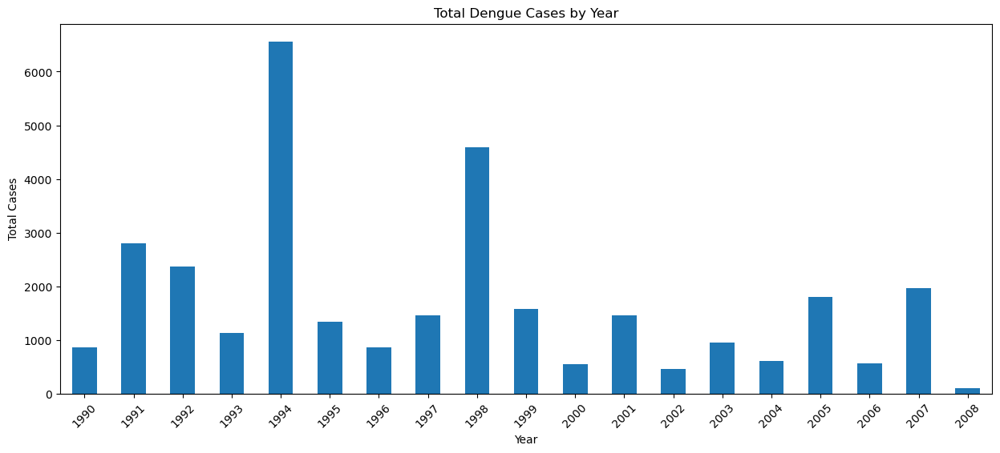

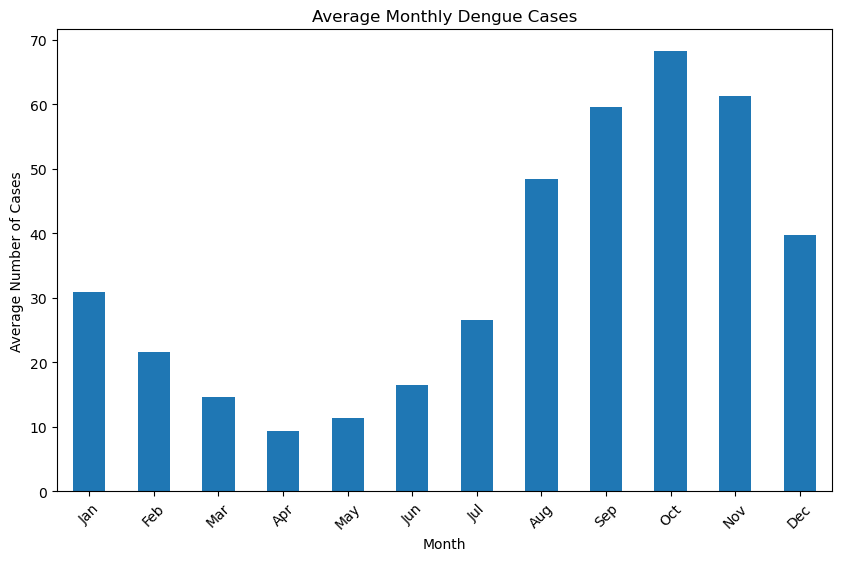

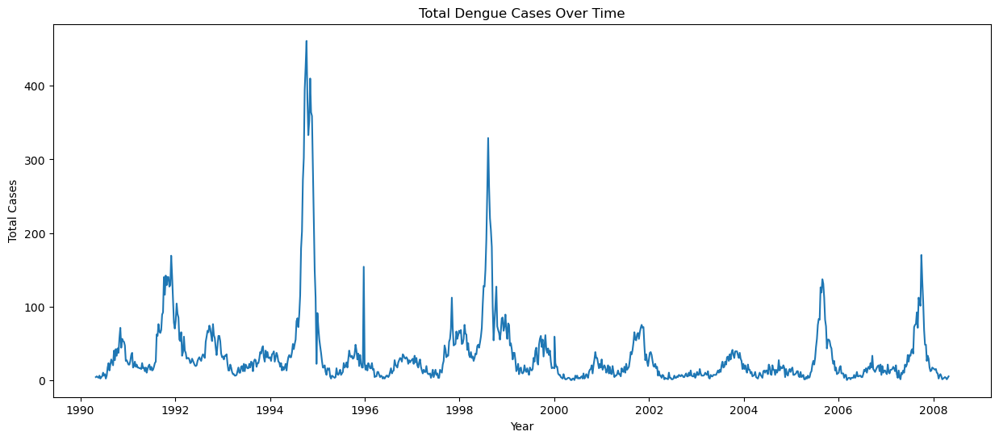

In [18]:
# Time series analysis 
# How did dengue change across the years?
from datetime import datetime
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller

## We can look at this data on an yearly basis

yearly_cases = df_sj['total_cases'].resample('Y').sum()

# Plotting total dengue cases over time
plt.figure(figsize=(15, 6))
yearly_cases.plot(kind='bar')
plt.title('Total Dengue Cases by Year')
plt.xlabel('Year')
plt.ylabel('Total Cases')
plt.xticks(rotation=45)  # Rotating x-axis labels for better readability
plt.xticks(ticks=np.arange(len(yearly_cases.index)), labels=[year.year for year in yearly_cases.index], rotation=45)

plt.show()

##

# Are there any monthly trends in dengue?
monthly_cases_avg = df_sj['total_cases'].resample('M').mean()

# Grouping by month to calculate the average for each month across all years
monthly_avg = monthly_cases_avg.groupby(monthly_cases_avg.index.month).mean()

# Plotting the average monthly dengue cases
plt.figure(figsize=(10, 6))
monthly_avg.plot(kind='bar')
plt.title('Average Monthly Dengue Cases')
plt.xlabel('Month')
plt.ylabel('Average Number of Cases')
plt.xticks(ticks=np.arange(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=45)
plt.show()


##

# Creating a new column 'date' combining 'year' and 'weekofyear' to create a datetime index
reduced_df['date'] = reduced_df.apply(lambda row: datetime.strptime(f"{int(row.year)}-{int(row.weekofyear)}-1", "%Y-%W-%w"), axis=1)

# Setting the new 'date' column as the index
reduced_df.set_index('date', inplace=True)

# Sorting the DataFrame by the date index
reduced_df.sort_index(inplace=True)

# Plotting total dengue cases over time
plt.figure(figsize=(15, 6))
plt.plot(reduced_df['total_cases'])
plt.title('Total Dengue Cases Over Time')
plt.xlabel('Year')
plt.ylabel('Total Cases')
plt.show()

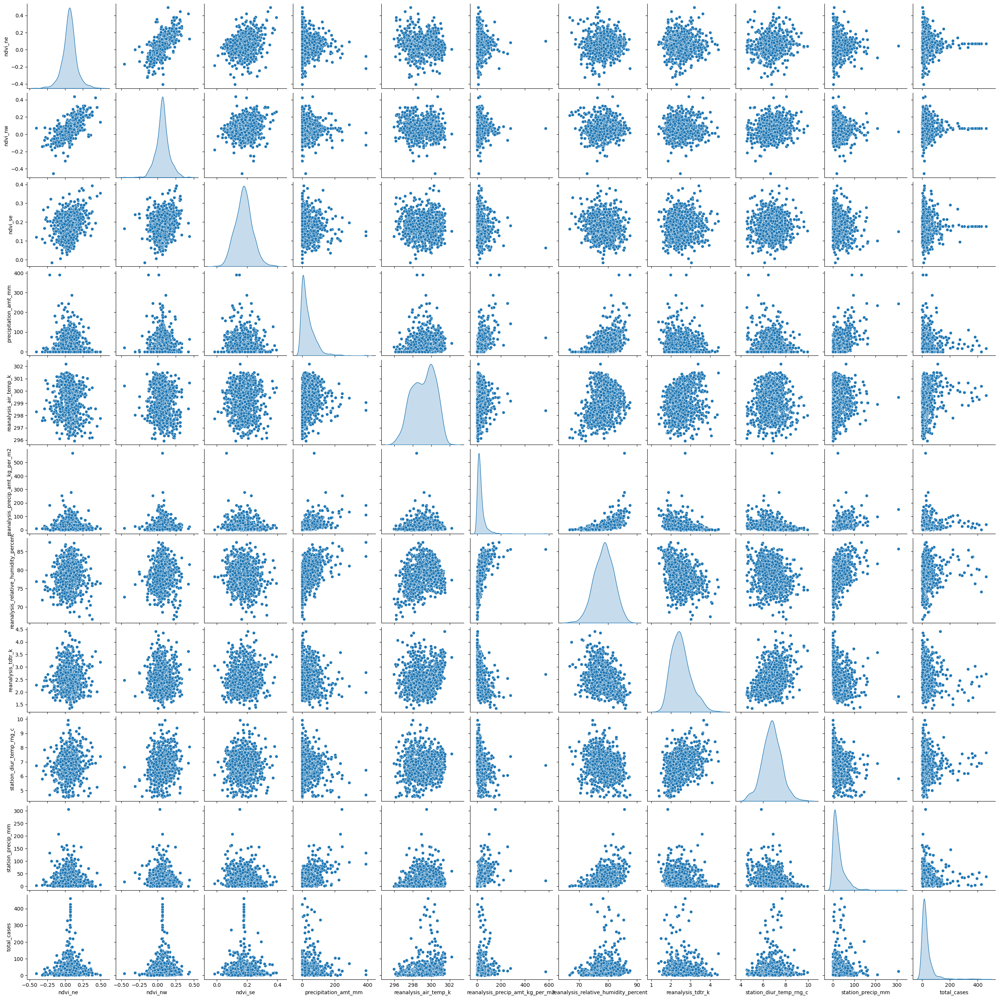

In [19]:
# Pair plots of all the features

columns_for_pairplot = ['ndvi_ne', 'ndvi_nw',
       'ndvi_se', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_tdtr_k',
       'station_diur_temp_rng_c', 'station_precip_mm', 'total_cases']

# Creating the pair plot
sns.pairplot(reduced_df[columns_for_pairplot].dropna(), diag_kind='kde')
plt.show()

We can see trends in the pair plots correlating the features with total cases. 

<h2> Principle Component Analysis </h2>

In [20]:
# PCA 

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

pca_data = reduced_df.select_dtypes(include=['float64', 'int64']).drop(columns=['year', 'weekofyear','total_cases'])

# Standardizing the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pca_data)

# Applying PCA
pca = PCA()
pca.fit(scaled_data)

# Creating a DataFrame with the PCA results
pca_results = pd.DataFrame({'explained_variance_ratio': pca.explained_variance_ratio_,
                            'cumulative_explained_variance': np.cumsum(pca.explained_variance_ratio_)})

pca_results

,explained_variance_ratio,cumulative_explained_variance
0,0.292958,0.292958
1,0.186020,0.478978
2,0.135740,0.614718
3,0.094409,0.709127
4,0.078174,0.787301
5,0.063284,0.850584
6,0.049454,0.900038
7,0.039795,0.939833
8,0.030838,0.970671
9,0.029329,1.000000


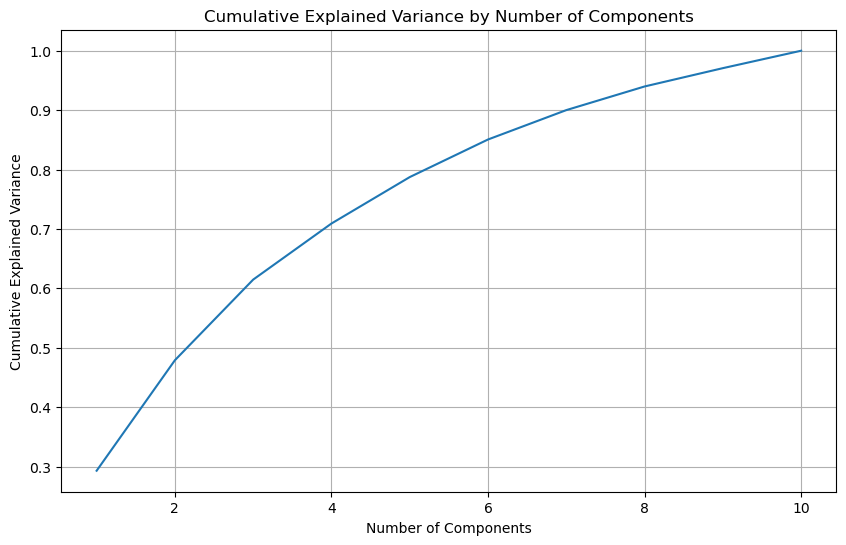

In [21]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca_results) + 1), pca_results['cumulative_explained_variance'])
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Number of Components')
plt.grid(True)
plt.show()

In [22]:
# Let's look at the loadings now to see which features contributed most to the PCA (and drop the ones that didn't)

loadings = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(len(pca.components_))], index=pca_data.columns)
loadings

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
ndvi_ne,-0.083589,-0.649470,-0.028071,0.075871,-0.005112,-0.251653,0.050826,-0.082037,-0.041257,-0.700204
ndvi_nw,-0.071476,-0.645403,-0.044254,0.168689,-0.059242,-0.222897,-0.047998,0.082992,0.109984,0.688078
ndvi_se,-0.142269,-0.291651,0.052788,-0.803174,0.320822,0.371680,-0.007701,-0.027278,-0.023120,0.066433
precipitation_amt_mm,0.434245,-0.036676,-0.270788,0.020550,0.372835,-0.024160,-0.055387,0.759350,0.087597,-0.096926
reanalysis_air_temp_k,0.146695,0.063751,-0.600365,-0.405601,-0.517002,-0.221883,-0.127707,-0.088335,0.328409,-0.031277
reanalysis_precip_amt_kg_per_m2,0.459640,-0.114470,0.016345,0.105068,0.064569,0.270839,0.642902,-0.289346,0.435187,0.019149
reanalysis_relative_humidity_percent,0.461487,-0.168279,-0.108710,-0.020626,-0.342495,0.251302,0.061956,-0.034864,-0.745894,0.067832
reanalysis_tdtr_k,-0.267502,0.129558,-0.566707,0.015706,0.401398,-0.274868,0.451286,-0.164316,-0.334889,0.103783
station_diur_temp_rng_c,-0.265000,-0.113869,-0.473030,0.376787,0.026345,0.675929,-0.269963,-0.064963,0.110628,-0.064580
station_precip_mm,0.437668,-0.001331,-0.060853,0.045658,0.451612,-0.173455,-0.531014,-0.533916,-0.002667,0.039584


Based on the output, here are the most significant contributors to the PCA:
PC1 = precipitation_amt_mm, reanalysis_precip_amt_kg_per_m2, reanalysis_relative_humidity_percent, station_precip_mm, total_cases
PC2 = ndvi_ne, ndvi_nw, 
PC3 = reanalysis_air_temp_k, reanalysis_tdtr_k, station_diur_temp_rng_c
PC4 = total_cases
PC5 = ndvi_se 
PC6 = reanalysis_air_temp_k

What features don't contribute? All seem to contribute to the first 6 components.

<h1> Multiple Linear Regression </h1>

Let's standardize the numerical features now before we start regression

In [81]:
# Scaling all the numerical features 

selected_features = reduced_df[['ndvi_ne', 'ndvi_nw',
       'ndvi_se', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_tdtr_k',
       'station_diur_temp_rng_c', 'station_precip_mm']] 

scaler = StandardScaler()
scaled_features = scaler.fit_transform(selected_features)

scaled = pd.DataFrame(scaled_features, columns=selected_features.columns, index=selected_features.index)
scaled_df = reduced_df
scaled_df[selected_features.columns] = scaled

scaled_df.head

<bound method NDFrame.head of            city  year  weekofyear week_start_date   ndvi_ne   ndvi_nw  \
date                                                                    
1990-04-30   sj  1990          18      1990-04-30  0.632993  0.402603   
1990-05-07   sj  1990          19      1990-05-07  1.104621  0.829945   
1990-05-14   sj  1990          20      1990-05-14 -0.267888  1.172170   
1990-05-21   sj  1990          21      1990-05-21  0.693151  1.973504   
1990-05-28   sj  1990          22      1990-05-28  1.366859  2.163928   
...         ...   ...         ...             ...       ...       ...   
2008-03-31   sj  2008          13      2008-03-25  0.186790 -1.193675   
2008-04-07   sj  2008          14      2008-04-01 -0.968351 -0.937307   
2008-04-14   sj  2008          15      2008-04-08 -2.136953 -1.336492   
2008-04-21   sj  2008          16      2008-04-15 -0.571505  0.006382   
2008-04-28   sj  2008          17      2008-04-22 -0.958380 -0.865435   

             ndvi_se

In [82]:
lrm = LinearRegression()
lrm

LinearRegression()

In [83]:
columns_for_x = ['year', 'weekofyear','ndvi_ne', 'ndvi_nw',
       'ndvi_se', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'reanalysis_tdtr_k',
       'station_diur_temp_rng_c', 'station_precip_mm']

X = scaled_df[columns_for_x]
Y = scaled_df['total_cases']
lrm.fit(X,Y)

LinearRegression()

In [85]:
intercept = lrm.intercept_
slope = lrm.coef_
print("The intercept is =",intercept)

for i, col in enumerate(columns_for_x):
    print(f"{col}: {slope[i]}")
    
    


The intercept is = 5350.923692614197
year: -2.6689730405040955
weekofyear: 0.6818810472167027
ndvi_ne: -1.8392445205367265
ndvi_nw: -2.0392271889248637
ndvi_se: 0.9228153417779735
precipitation_amt_mm: -1.1154419748017936
reanalysis_air_temp_k: 6.280938937374457
reanalysis_precip_amt_kg_per_m2: 2.2259644652225257
reanalysis_relative_humidity_percent: -2.382653612011402
reanalysis_tdtr_k: 0.8713459348879631
station_diur_temp_rng_c: -0.310876204754128
station_precip_mm: 1.4723680153353267


In [27]:
# Let's test the Linear Regression Model

new_data = {
    'year': [2005],
'weekofyear': [45],
'ndvi_ne':[0.2] ,
'ndvi_nw':[0.5] ,
'ndvi_se':[0.4] ,
'precipitation_amt_mm':[24] ,
'reanalysis_air_temp_k':[250] ,
'reanalysis_precip_amt_kg_per_m2':[25] ,
'reanalysis_relative_humidity_percent':[50] ,
'reanalysis_tdtr_k':[300],
'station_diur_temp_rng_c':[26] ,
'station_precip_mm':[66] 
}

new_data_df = pd.DataFrame(new_data)


predicted_total_cases = lrm.predict(new_data_df)

print("Predicted total_cases:", predicted_total_cases)


Predicted total_cases: [1859.7769033]


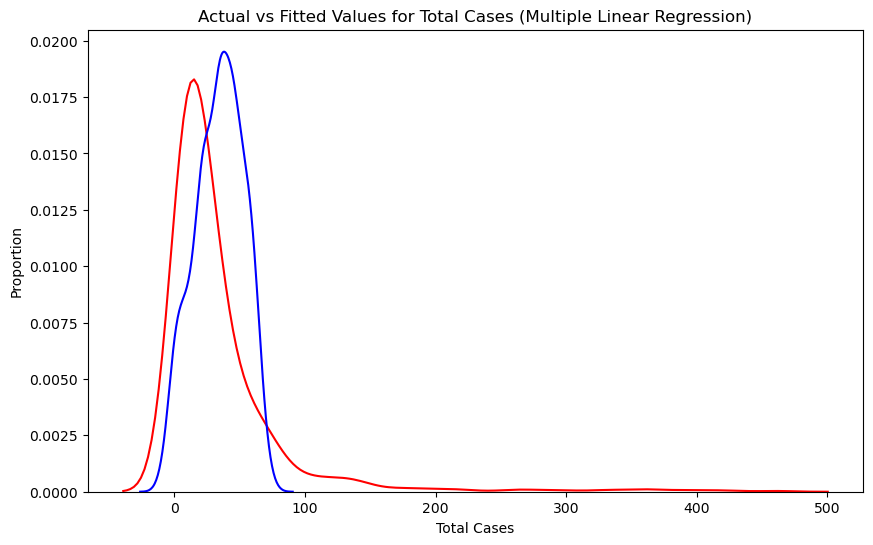

In [28]:
#Let's plot the regression

# Predicting the values
Y_hat = lrm.predict(X)

# Plotting the results
plt.figure(figsize=(10, 6))

ax1 = sns.kdeplot(Y, color="r", label='Actual Value')
sns.kdeplot(Y_hat, color="b", label='Fitted Values', ax=ax1)

plt.title('Actual vs Fitted Values for Total Cases (Multiple Linear Regression)')
plt.xlabel('Total Cases')
plt.ylabel('Proportion')

plt.show()


In [29]:
# Let's look at how good this model is

#R squared
print('R^2: ', lrm.score(X, Y))

# MSE 
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import math

mse = mean_squared_error(scaled_df['total_cases'], Y_hat) #Looking at actual vs predicted total_cases
print('Mean Square Error: ', mse)
print("Root Mean Squared Error: " + str(math.sqrt(mse)))

#MAE
mae = mean_absolute_error(Y, Y_hat)
print(f"Mean Absolute Error: {mae}")


R^2:  0.1306456780034536
Mean Square Error:  2292.6828460476436
Root Mean Squared Error: 47.88196785897217
Mean Absolute Error: 26.488869679463214


<h2> Random Forests </h2>

R^2 score: 0.6992027394590535
Mean Squared Error: 790.3970228723406
Root Mean Squared Error: 28.114000477917415
Mean Absolute Error: 13.871968085106385


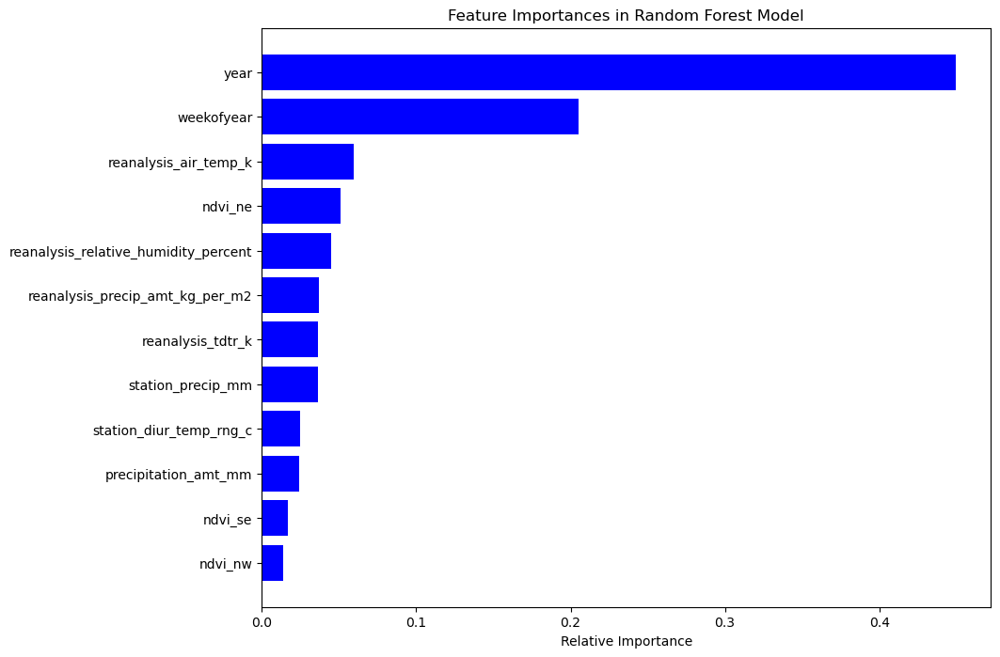

In [30]:
# Okay let's try Random Forest now for San Juan
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.metrics import r2_score

# San Juan
sj_df = scaled_df


a = sj_df.drop(['total_cases','city','week_start_date'], axis=1)
b = sj_df['total_cases']
X_train, X_test, y_train, y_test = train_test_split(a, b, test_size=0.2, random_state=42)

rf = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model
rf.fit(X_train, y_train)

# Make predictions
y_pred = rf.predict(X_test)

# Evaluate 
r2 = r2_score(y_test, y_pred)
print(f"R^2 score: {r2}")

mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error: " + str(mse))
print("Root Mean Squared Error: " + str(math.sqrt(mse)))

mae_rf_sj = mean_absolute_error(y_test, y_pred)

print(f"Mean Absolute Error: {mae_rf_sj}")

#Feature importances 
features = X_train.columns
importances = rf.feature_importances_

# Sorting the feature importances
indices = np.argsort(importances)

# Creating the plot
plt.figure(figsize=(10, 8))
plt.title('Feature Importances in Random Forest Model')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()


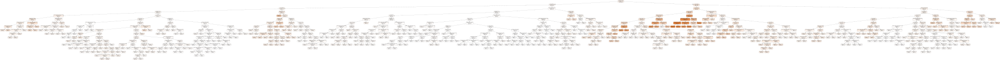

In [31]:
# Let's try visualising this tree
from sklearn.tree import export_graphviz
import graphviz

# Select a single tree from your trained Random Forest model
# Let's select the first tree as an example
single_tree = rf.estimators_[0]

# Export the tree
dot_data = export_graphviz(single_tree, out_file=None, 
                           feature_names=a.columns,  
                           class_names=['total_cases'],
                           filled=True, rounded=True,  
                           special_characters=True)  

# Render the tree
graph = graphviz.Source(dot_data)  
graph.render("decision_tree")  
graph

<h3> Hyper Parameter Tuning </h3>

In [32]:
#Let's try tuning the hyper parameters...

from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [50,100,200],  # Number of trees
    'max_depth': [None, 10, 20],  # Maximum depth of the trees
    'min_samples_split': [2, 4, 6],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]  # Minimum number of samples required to be at a leaf node
}

# Initialize the Random Forest model
rf = RandomForestRegressor(random_state=42)

# Initialize the Grid Search model
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')

# Fit the Grid Search model
grid_search.fit(X_train, y_train)

# Get the best parameters and the best model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

print(f"Best parameters: {best_params}")


Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}


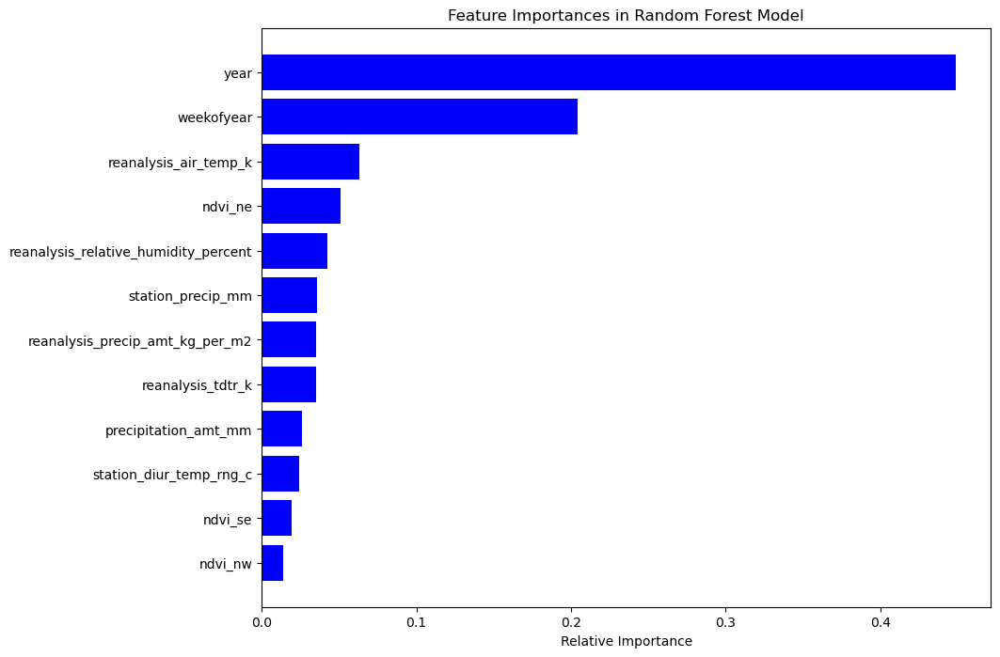

R^2 score: 0.7061136325334392
Mean Squared Error: 772.2374515332928
Root Mean Squared Error: 27.789160684218096
Mean Absolute Error: 13.790756283516776


In [33]:
# Train the model
best_model.fit(X_train, y_train)

# Making predictions with the best model
y_pred = best_model.predict(X_test)

#Feature importances 
features = X_train.columns
importances = best_model.feature_importances_

# Sorting the feature importances
indices = np.argsort(importances)

# Creating the plot
plt.figure(figsize=(10, 8))
plt.title('Feature Importances in Random Forest Model')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# Evaluate the model
r2 = r2_score(y_test, y_pred)
print(f"R^2 score: {r2}")


mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
print(f"Root Mean Squared Error: {math.sqrt(mse)}")


mae_rf_sj = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae_rf_sj}")


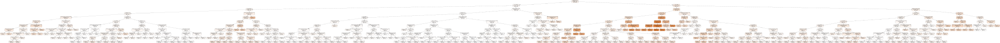

In [34]:
# Let's try visualising this tree

single_tree = best_model.estimators_[0]

# Export the tree in DOT format
dot_data = export_graphviz(single_tree, out_file=None, 
                           feature_names=a.columns,  
                           class_names=['total_cases'],
                           filled=True, rounded=True,  
                           special_characters=True)  

# Render the tree
graph = graphviz.Source(dot_data)  
graph.render("decision_tree_best_model") 
graph

<h2> Cross Validation </h2>

I'm going to do some k-fold cross fold validation to validate my random forest, since it performs the best

In [35]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.metrics import make_scorer

kf = KFold(n_splits=4, shuffle=True, random_state=42)

mse_scorer = make_scorer(mean_squared_error, greater_is_better=False)

# Perform k-fold cross-validation for Linear Regression
lr_scores = cross_val_score(lrm, X, Y, cv=kf, scoring=mse_scorer)
print("Linear Regression - Mean MSE:", np.mean(lr_scores), "Std MSE:", np.std(lr_scores))



Linear Regression - Mean MSE: -2332.444275348444 Std MSE: 213.0380250193824


In [36]:
# Perform k-fold cross-validation for Random Forest
rf_scores = cross_val_score(rf, X, Y, cv=kf, scoring=mse_scorer)
print("Random Forest - Mean MSE:", np.mean(rf_scores), "Std MSE:", np.std(rf_scores))

Random Forest - Mean MSE: -735.0905653846153 Std MSE: 149.61902557582206


Through this, we see that the Random Forest is performing better than the Multiple linear regression model.

<h1> Iquitos Analysis </h1>

<h2> Missing Values and Imputation </h2>

In [37]:
# Check for missing values

missing_data = df_iq.isnull().sum()

#Calculate percentage of missing data to total data
total_data = len(df_iq)
missing_percentage = (missing_data / total_data) * 100
print(missing_percentage)

city                                     0.000000
year                                     0.000000
weekofyear                               0.000000
week_start_date                          0.000000
ndvi_ne                                  0.576923
ndvi_nw                                  0.576923
ndvi_se                                  0.576923
ndvi_sw                                  0.576923
precipitation_amt_mm                     0.769231
reanalysis_air_temp_k                    0.769231
reanalysis_avg_temp_k                    0.769231
reanalysis_dew_point_temp_k              0.769231
reanalysis_max_air_temp_k                0.769231
reanalysis_min_air_temp_k                0.769231
reanalysis_precip_amt_kg_per_m2          0.769231
reanalysis_relative_humidity_percent     0.769231
reanalysis_sat_precip_amt_mm             0.769231
reanalysis_specific_humidity_g_per_kg    0.769231
reanalysis_tdtr_k                        0.769231
station_avg_temp_c                       7.115385


In [38]:
# Let's start with replacing all the other columns with their column medians. 

df_iq = df[df['city'] == 'iq'].copy()

# Replace all the other columns' missing values with their column medians
for column in df_iq.columns:
    if column != 'week_start_date' and column != 'city':
        median_value = df_iq[column].median()
        df_iq[column].fillna(median_value, inplace=True)
        

#Checking if it was done
missing_data = df_iq.isnull().sum()
print(missing_data)

city                                     0
year                                     0
weekofyear                               0
week_start_date                          0
ndvi_ne                                  0
ndvi_nw                                  0
ndvi_se                                  0
ndvi_sw                                  0
precipitation_amt_mm                     0
reanalysis_air_temp_k                    0
reanalysis_avg_temp_k                    0
reanalysis_dew_point_temp_k              0
reanalysis_max_air_temp_k                0
reanalysis_min_air_temp_k                0
reanalysis_precip_amt_kg_per_m2          0
reanalysis_relative_humidity_percent     0
reanalysis_sat_precip_amt_mm             0
reanalysis_specific_humidity_g_per_kg    0
reanalysis_tdtr_k                        0
station_avg_temp_c                       0
station_diur_temp_rng_c                  0
station_max_temp_c                       0
station_min_temp_c                       0
station_pre

<h2> Checking for Outliers </h2>

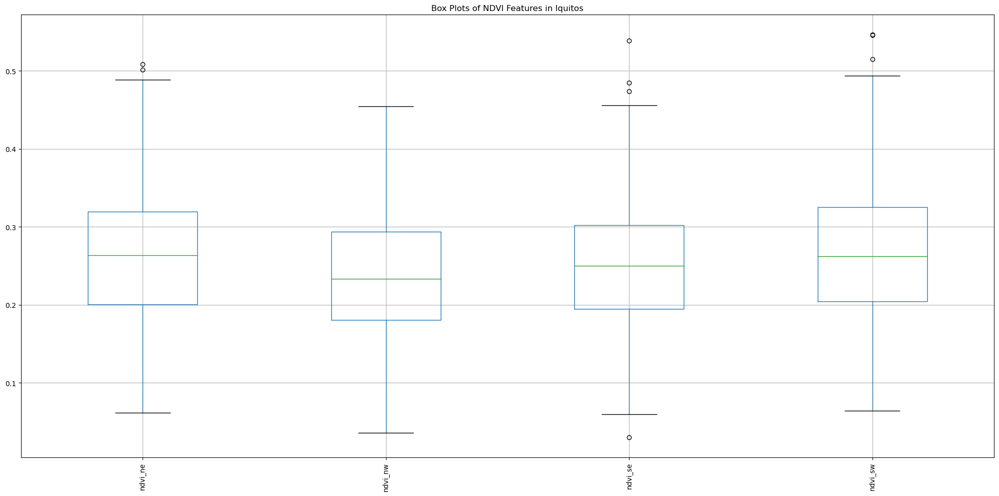

In [39]:
# Check for outliers

numerical_data = df_iq.select_dtypes(include=['float64', 'int64'])

# Remove columns that are not relevant for box plots
numerical_data = numerical_data.drop(columns=['year', 'weekofyear'])

#first plot ndvi data
ndvi_data = numerical_data[['ndvi_ne','ndvi_nw','ndvi_se','ndvi_sw']]

plt.figure(figsize=(20, 10))
ndvi_data.boxplot(rot=90)
plt.title('Box Plots of NDVI Features in Iquitos')
plt.tight_layout()

plt.show()

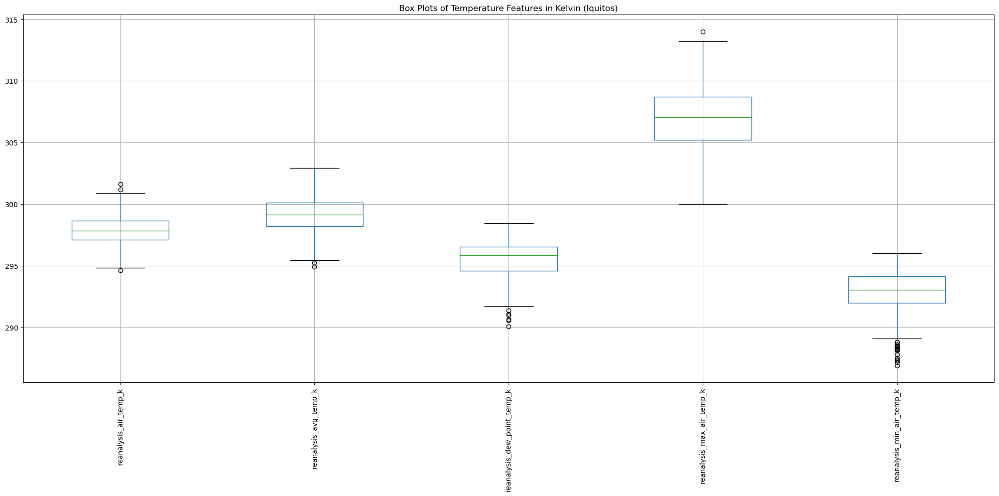

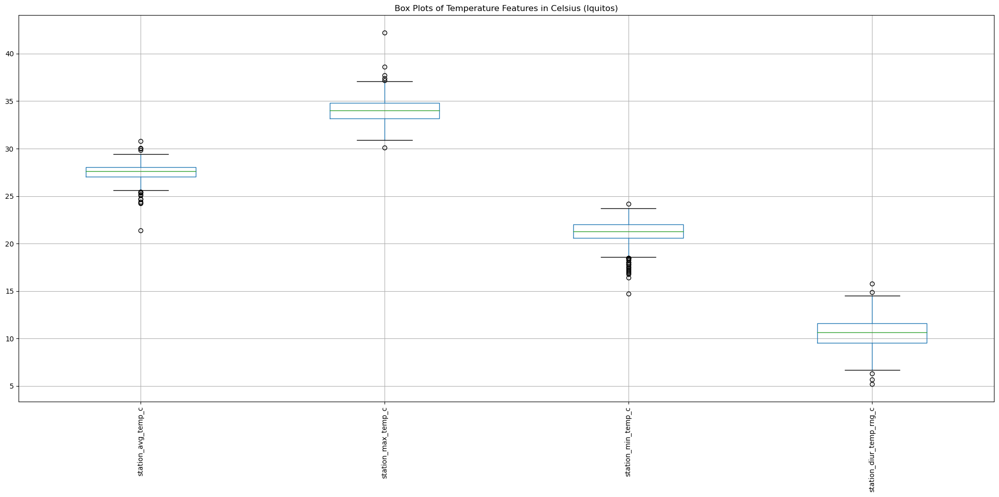

In [40]:
# Now check for outliers in the temperature data in Iquitos
temp_data_k = numerical_data[['reanalysis_air_temp_k', 
    'reanalysis_avg_temp_k', 
    'reanalysis_dew_point_temp_k', 
    'reanalysis_max_air_temp_k', 
    'reanalysis_min_air_temp_k']]

plt.figure(figsize=(20, 10))
temp_data_k.boxplot(rot=90)
plt.title('Box Plots of Temperature Features in Kelvin (Iquitos)')
plt.tight_layout()

plt.show()

temp_data_c = numerical_data[['station_avg_temp_c',
    'station_max_temp_c', 
    'station_min_temp_c','station_diur_temp_rng_c']]

plt.figure(figsize=(20, 10))
temp_data_c.boxplot(rot=90)
plt.title('Box Plots of Temperature Features in Celsius (Iquitos)')
plt.tight_layout()


plt.show()

# tdtr = numerical_data['reanalysis_tdtr_k']
# tdtr.boxplot(rot=90)
# plt.title('Box Plot of TDTR in Kelvin (San Juan)')

# plt.show()


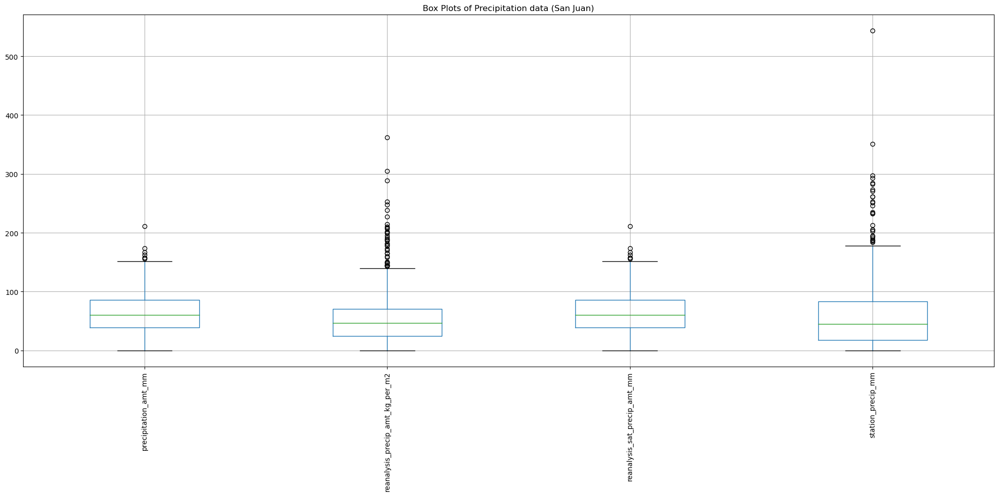

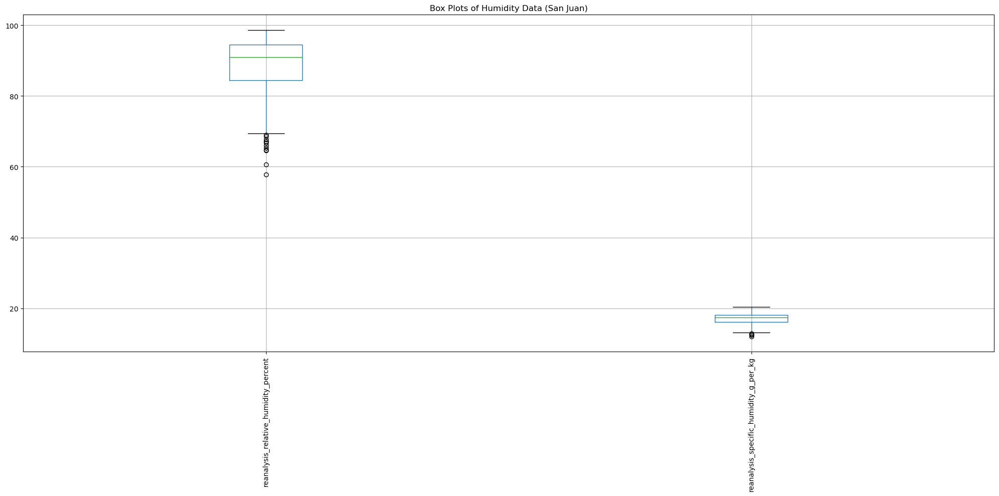

In [41]:
# Now check for outliers in the precipitation data in San Juan
temp_data_k = numerical_data[['precipitation_amt_mm', 
    'reanalysis_precip_amt_kg_per_m2', 
    'reanalysis_sat_precip_amt_mm','station_precip_mm']]

plt.figure(figsize=(20, 10))
temp_data_k.boxplot(rot=90)
plt.title('Box Plots of Precipitation data (San Juan)')
plt.tight_layout()

plt.show()

# Boxplots for Humidity data
temp_data_c = numerical_data[['reanalysis_relative_humidity_percent',
    'reanalysis_specific_humidity_g_per_kg']]

plt.figure(figsize=(20, 10))
temp_data_c.boxplot(rot=90)
plt.title('Box Plots of Humidity Data (San Juan)')
plt.tight_layout()

plt.show()

<h2>Checking for Collinearity</h2>

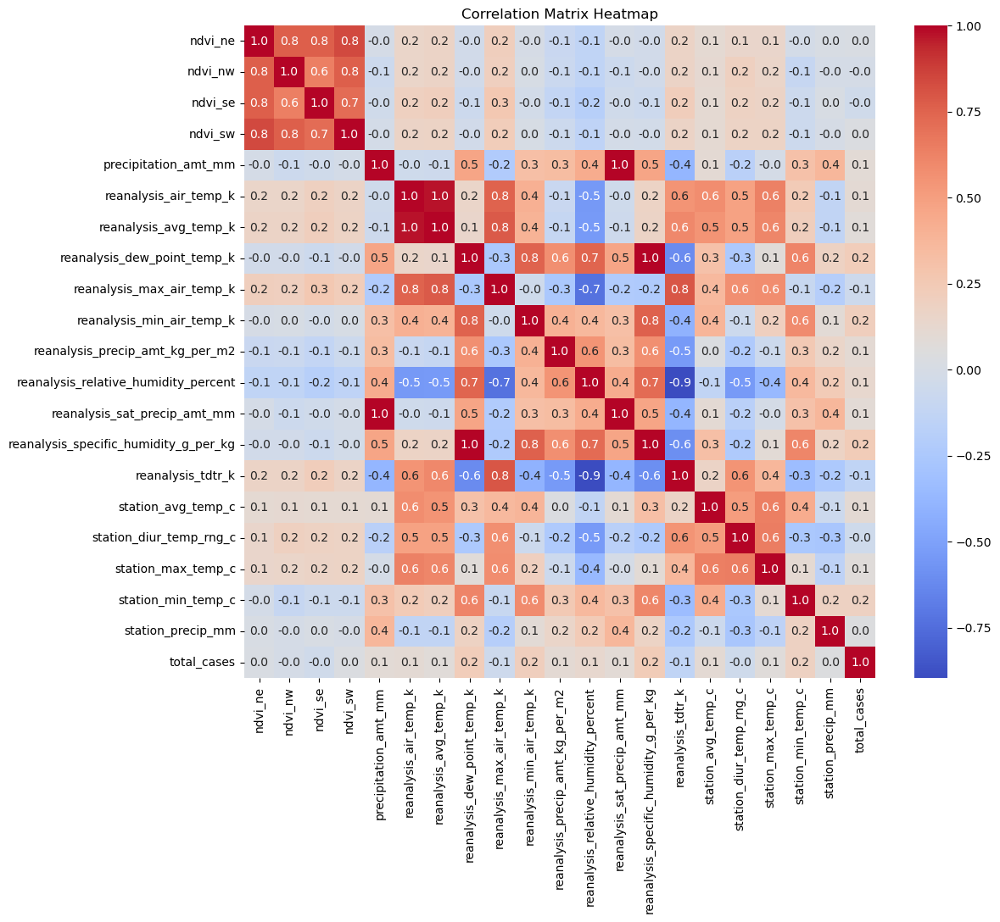

In [42]:
# Is there any collinearity between our data?

# Let's start with plotting a correlation map


corr_matrix = numerical_data.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt=".1f", cmap='coolwarm')
plt.title('Correlation Matrix Heatmap')
plt.show()

In [43]:
# We're going to drop all the columns with an absolute correlation value higher than 0.8 to reduce risk of collinearity 

# Identify all high correlation pairings
high_corr_pairs = {}

for i in range(len(corr_matrix.columns)):
    for j in range(i+1, len(corr_matrix.columns)):
        if abs(corr_matrix.iloc[i, j]) > 0.8:
            pair = (corr_matrix.columns[i], corr_matrix.columns[j])
            high_corr_pairs[pair] = corr_matrix.iloc[i, j]

high_corr_pairs

{('ndvi_ne', 'ndvi_sw'): 0.8427779969426731,
 ('precipitation_amt_mm', 'reanalysis_sat_precip_amt_mm'): 1.0,
 ('reanalysis_air_temp_k', 'reanalysis_avg_temp_k'): 0.9733155083214472,
 ('reanalysis_dew_point_temp_k',
  'reanalysis_specific_humidity_g_per_kg'): 0.9977740989653773,
 ('reanalysis_relative_humidity_percent',
  'reanalysis_tdtr_k'): -0.8963750469339697}

In [44]:
# Let's drop one of each pair from the dataset

columns_to_drop = set()

# We will choose the second column in each pair
for pair in high_corr_pairs.keys():
    columns_to_drop.add(pair[1])

# Dropping the selected columns from the dataframe
reduced_df = df_iq.drop(columns=columns_to_drop)

print("The following columns were dropped: " + str(columns_to_drop))

print("The remaining features are: " + str(reduced_df.columns))

The following columns were dropped: {'ndvi_sw', 'reanalysis_specific_humidity_g_per_kg', 'reanalysis_tdtr_k', 'reanalysis_avg_temp_k', 'reanalysis_sat_precip_amt_mm'}
The remaining features are: Index(['city', 'year', 'weekofyear', 'week_start_date', 'ndvi_ne', 'ndvi_nw',
       'ndvi_se', 'precipitation_amt_mm', 'reanalysis_air_temp_k',
       'reanalysis_dew_point_temp_k', 'reanalysis_max_air_temp_k',
       'reanalysis_min_air_temp_k', 'reanalysis_precip_amt_kg_per_m2',
       'reanalysis_relative_humidity_percent', 'station_avg_temp_c',
       'station_diur_temp_rng_c', 'station_max_temp_c', 'station_min_temp_c',
       'station_precip_mm', 'total_cases'],
      dtype='object')


In [45]:
# Summary Statistics
summary_statistics = reduced_df.describe()
summary_statistics

,year,weekofyear,ndvi_ne,ndvi_nw,ndvi_se,precipitation_amt_mm,reanalysis_air_temp_k,reanalysis_dew_point_temp_k,reanalysis_max_air_temp_k,reanalysis_min_air_temp_k,reanalysis_precip_amt_kg_per_m2,reanalysis_relative_humidity_percent,station_avg_temp_c,station_diur_temp_rng_c,station_max_temp_c,station_min_temp_c,station_precip_mm,total_cases
count,520.000000,520.000000,520.000000,520.000000,520.000000,520.000000,520.000000,520.000000,520.000000,520.000000,520.000000,520.000000,520.000000,520.000000,520.000000,520.000000,520.000000,520.000000
mean,2005.000000,26.503846,0.263868,0.238749,0.250124,64.216692,297.869179,295.495745,307.082500,292.868077,57.523942,88.656640,27.535847,10.570381,34.004423,21.198269,61.939038,7.565385
std,2.918283,15.029450,0.081135,0.076531,0.077130,35.084568,1.166483,1.412107,2.373781,1.656726,50.101921,7.557234,0.888482,1.479828,1.307264,1.250640,62.334113,10.765478
min,2000.000000,1.000000,0.061729,0.035860,0.029880,0.000000,294.635714,290.088571,300.000000,286.900000,0.000000,57.787143,21.400000,5.200000,30.100000,14.700000,0.000000,0.000000
25%,2002.750000,13.750000,0.200150,0.180260,0.194748,39.147500,297.095357,294.596429,305.200000,292.000000,24.212500,84.387500,27.050000,9.550000,33.200000,20.600000,18.000000,1.000000
50%,2005.000000,26.500000,0.263643,0.232971,0.249800,60.470000,297.822857,295.852143,307.050000,293.050000,46.440000,90.917143,27.600000,10.625000,34.000000,21.300000,45.300000,5.000000
75%,2007.250000,39.250000,0.319618,0.293832,0.302129,85.637500,298.645357,296.544643,308.700000,294.125000,70.432500,94.553571,28.040000,11.600000,34.800000,22.000000,83.350000,9.000000
max,2010.000000,53.000000,0.508357,0.454429,0.538314,210.830000,301.637143,298.450000,314.000000,296.000000,362.030000,98.610000,30.800000,15.800000,42.200000,24.200000,543.300000,116.000000


<h2> Time Series Analysis of Dengue Cases </h2>

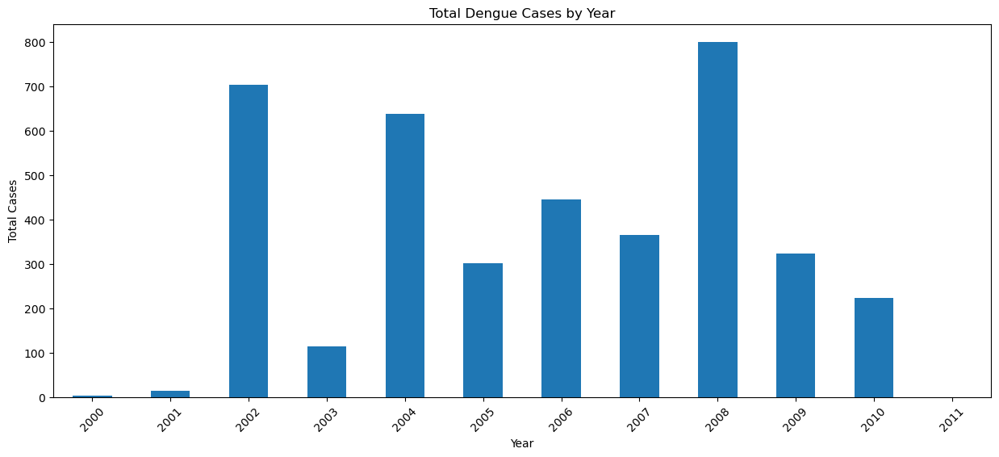

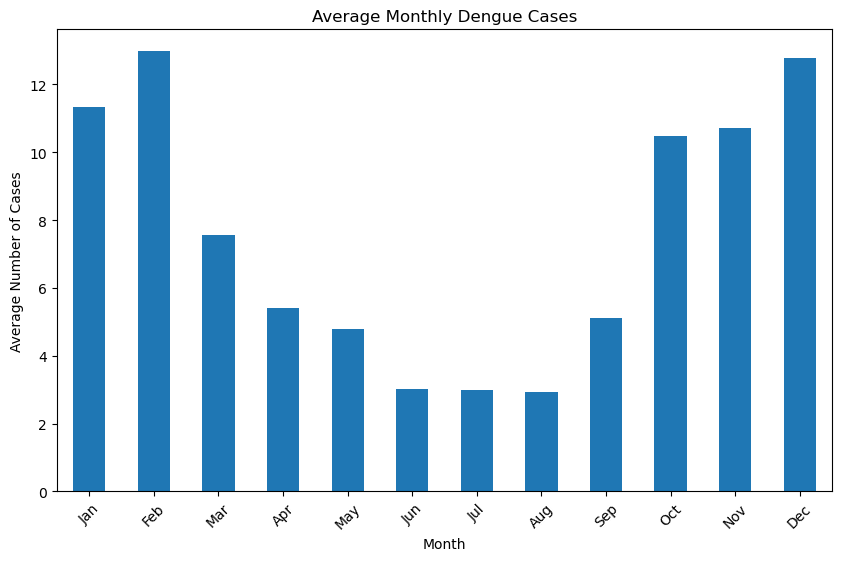

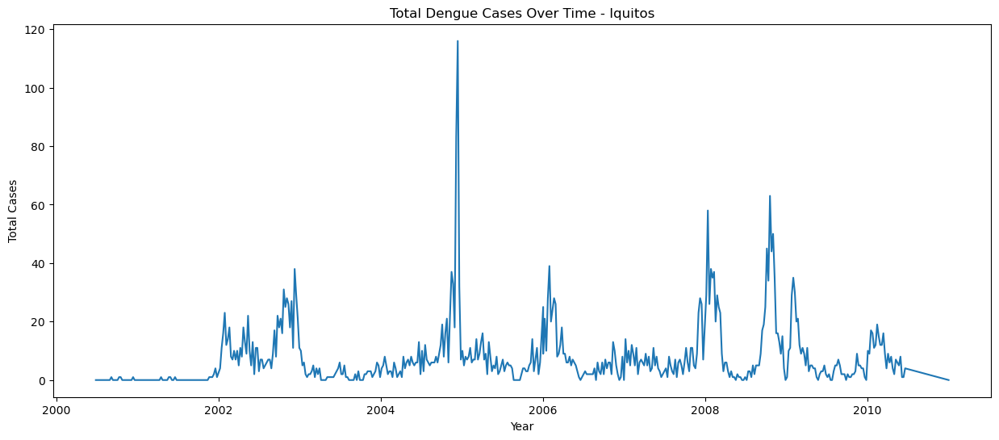

In [46]:
# Time series analysis 

# How did dengue change across the years?

## We can look at this data on an yearly basis
df_iq['date'] = df_iq.apply(lambda row: pd.to_datetime(f"{int(row.year)}-{int(row.weekofyear)}-1", format="%Y-%W-%w"), axis=1)
df_iq.set_index('date', inplace=True)

yearly_cases = df_iq['total_cases'].resample('Y').sum()

# Plotting total dengue cases over time
plt.figure(figsize=(15, 6))
yearly_cases.plot(kind='bar')
plt.title('Total Dengue Cases by Year')
plt.xlabel('Year')
plt.ylabel('Total Cases')
plt.xticks(rotation=45)  # Rotating x-axis labels for better readability
plt.xticks(ticks=np.arange(len(yearly_cases.index)), labels=[year.year for year in yearly_cases.index], rotation=45)

plt.show()

# Are there any monthly trends in dengue?
monthly_cases_avg = df_iq['total_cases'].resample('M').mean()

# Grouping by month to calculate the average for each month across all years
monthly_avg = monthly_cases_avg.groupby(monthly_cases_avg.index.month).mean()

# Plotting the average monthly dengue cases
plt.figure(figsize=(10, 6))
monthly_avg.plot(kind='bar')
plt.title('Average Monthly Dengue Cases')
plt.xlabel('Month')
plt.ylabel('Average Number of Cases')
plt.xticks(ticks=np.arange(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], rotation=45)
plt.show()

# Creating a new column 'date' combining 'year' and 'weekofyear' to create a datetime index
reduced_df['date'] = reduced_df.apply(lambda row: datetime.strptime(f"{int(row.year)}-{int(row.weekofyear)}-1", "%Y-%W-%w"), axis=1)

# Setting the new 'date' column as the index
reduced_df.set_index('date', inplace=True)

# Sorting the DataFrame by the date index
reduced_df.sort_index(inplace=True)

# Plotting total dengue cases over time
plt.figure(figsize=(15, 6))
plt.plot(reduced_df['total_cases'])
plt.title('Total Dengue Cases Over Time - Iquitos')
plt.xlabel('Year')
plt.ylabel('Total Cases')
plt.show()

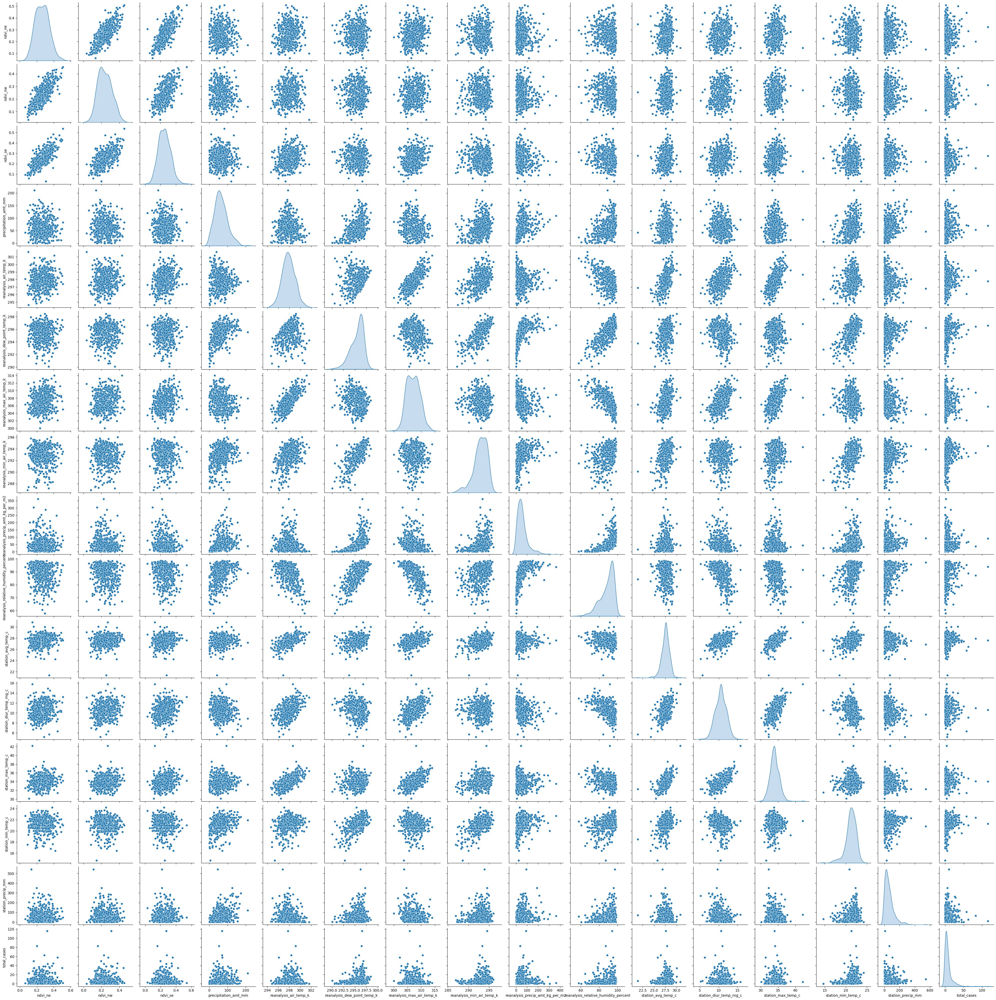

In [47]:
# Pair plots of all the features

columns_for_pairplot = ['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'precipitation_amt_mm', 
                        'reanalysis_air_temp_k', 'reanalysis_dew_point_temp_k', 
                        'reanalysis_max_air_temp_k', 'reanalysis_min_air_temp_k', 
                        'reanalysis_precip_amt_kg_per_m2', 'reanalysis_relative_humidity_percent', 
                        'station_avg_temp_c', 'station_diur_temp_rng_c', 'station_max_temp_c', 
                        'station_min_temp_c', 'station_precip_mm', 'total_cases']

# Creating the pair plot
sns.pairplot(reduced_df[columns_for_pairplot].dropna(), diag_kind='kde')
plt.show()

<h2> Principal Component Analysis (PCA) </h2>

In [48]:
# PCA 

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

pca_data = reduced_df.select_dtypes(include=['float64', 'int64']).drop(columns=['year', 'weekofyear'])

# Standardizing the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pca_data)

# Applying PCA
pca = PCA()
pca.fit(scaled_data)

# Creating a DataFrame with the PCA results
pca_results = pd.DataFrame({'explained_variance_ratio': pca.explained_variance_ratio_,
                            'cumulative_explained_variance': np.cumsum(pca.explained_variance_ratio_)})

pca_results

,explained_variance_ratio,cumulative_explained_variance
0,0.275097,0.275097
1,0.221515,0.496612
2,0.136875,0.633487
3,0.064407,0.697893
4,0.059459,0.757352
5,0.052732,0.810084
6,0.043181,0.853265
7,0.033790,0.887056
8,0.026679,0.913735
9,0.021476,0.935211


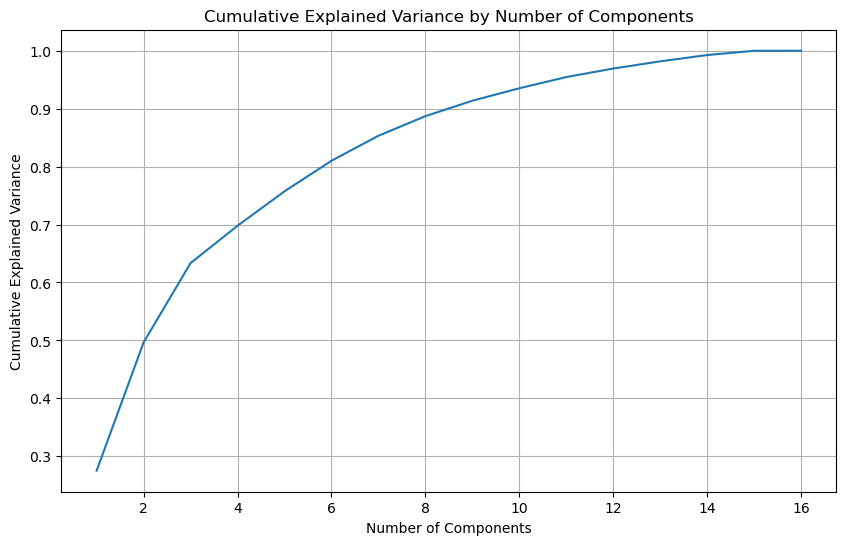

In [49]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(pca_results) + 1), pca_results['cumulative_explained_variance'])
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Number of Components')
plt.grid(True)
plt.show()

In [50]:
# Let's look at the loadings now to see which features contributed most to the PCA (and drop the ones that didn't)

loadings = pd.DataFrame(pca.components_.T, columns=[f'PC{i+1}' for i in range(len(pca.components_))], index=pca_data.columns)
loadings

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16
ndvi_ne,0.183220,-0.103508,0.560202,-0.064626,0.029586,-0.025352,-0.032404,-0.038021,0.123541,0.042070,0.003812,0.182635,-0.376326,0.662739,-0.049309,0.004583
ndvi_nw,0.188835,-0.091305,0.520874,-0.104082,-0.053063,0.046305,-0.019934,0.082881,-0.220369,0.623484,0.194881,-0.072049,0.192238,-0.379731,-0.002306,-0.003855
ndvi_se,0.205248,-0.089706,0.512476,-0.002862,-0.004913,-0.071581,0.006648,-0.052267,0.139401,-0.658362,-0.226295,-0.059262,0.231449,-0.342209,0.031501,0.000716
precipitation_amt_mm,-0.212283,-0.216953,0.083172,0.466539,-0.079679,0.321826,-0.054467,-0.725114,0.131337,0.132439,-0.054299,0.039745,0.056721,-0.037846,0.025382,0.001617
reanalysis_air_temp_k,0.286668,-0.332670,-0.156925,0.057528,0.123127,-0.206527,0.333056,-0.121005,-0.115018,0.035729,-0.070381,-0.084706,0.149086,0.084861,-0.571418,0.461794
reanalysis_dew_point_temp_k,-0.262237,-0.398539,0.033637,-0.132702,-0.110051,-0.025817,0.036895,-0.014396,-0.188782,-0.155673,0.223042,-0.447759,-0.088779,0.071148,-0.313227,-0.564045
reanalysis_max_air_temp_k,0.385591,-0.128443,-0.113552,0.132754,0.057450,-0.095217,0.382406,-0.081176,0.192440,0.024140,0.225558,-0.445760,-0.257275,-0.032195,0.533534,0.005847
reanalysis_min_air_temp_k,-0.131902,-0.423484,-0.038103,-0.135881,-0.004082,-0.203594,0.176474,-0.090706,-0.560435,-0.055379,-0.200654,0.373626,0.011411,0.031443,0.452017,-0.007713
reanalysis_precip_amt_kg_per_m2,-0.250171,-0.208884,0.038205,-0.111481,-0.340664,0.282783,0.566910,0.315112,0.423572,0.112275,-0.196877,0.167372,0.048935,-0.039381,-0.018299,-0.011007
reanalysis_relative_humidity_percent,-0.416954,-0.113232,0.132376,-0.151885,-0.179674,0.122182,-0.187852,0.079190,-0.080951,-0.149013,0.229011,-0.299997,-0.167641,-0.005587,0.127691,0.684341


To explain 80% of variance, we can select 6 components of PCA
Based on this, we will remove the following features which have low loadings across the first 6 components:
reanalysis_dew_point_temp_k, reanalysis_max_air_temp_k, reanalysis_precip_amt_kg_per_m2, station_avg_temp_c, station_max_temp_c


In [51]:
columns_to_drop = ['station_max_temp_c']
reduced_df = reduced_df.drop(columns_to_drop, axis=1)

<h1> Multiple Linear Regression </h1>

In [52]:
# Multiple Linear Regression

# Scaling all the numerical features 

selected_features = reduced_df[['ndvi_ne', 'ndvi_nw', 'ndvi_se', 'precipitation_amt_mm', 
                        'reanalysis_air_temp_k', 'reanalysis_min_air_temp_k', 
                       'reanalysis_relative_humidity_percent', 
                         'station_diur_temp_rng_c',
                        'station_min_temp_c', 'station_precip_mm','reanalysis_dew_point_temp_k', 
                        'reanalysis_max_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'station_avg_temp_c']] 

scaler = StandardScaler()
scaled_features = scaler.fit_transform(selected_features)

scaled = pd.DataFrame(scaled_features, columns=selected_features.columns, index=selected_features.index)
scaled_df = reduced_df
scaled_df[selected_features.columns] = scaled

scaled_df.head

<bound method NDFrame.head of            city  year  weekofyear week_start_date   ndvi_ne   ndvi_nw  \
date                                                                    
2000-06-26   iq  2000          26      2000-07-01 -0.875715 -1.392839   
2000-07-03   iq  2000          27      2000-07-08 -0.580272  0.488518   
2000-07-10   iq  2000          28      2000-07-15 -1.074694 -0.858270   
2000-07-17   iq  2000          29      2000-07-22 -0.445856 -1.220565   
2000-07-24   iq  2000          30      2000-07-29  0.799129  1.090538   
...         ...   ...         ...             ...       ...       ...   
2010-05-31   iq  2010          22      2010-06-04 -1.279489 -1.025125   
2010-06-07   iq  2010          23      2010-06-11 -0.207399 -1.212345   
2010-06-14   iq  2010          24      2010-06-18  0.864163  0.091843   
2010-06-21   iq  2010          25      2010-06-25  0.423377 -0.075571   
2011-01-03   iq  2010          53      2010-01-01 -0.002779 -0.075571   

             ndvi_se

In [53]:
lrm = LinearRegression()
lrm

columns_for_x = ['year', 'weekofyear','ndvi_ne', 'ndvi_nw', 'ndvi_se', 'precipitation_amt_mm', 
                        'reanalysis_air_temp_k', 'reanalysis_min_air_temp_k', 
                       'reanalysis_relative_humidity_percent', 
                         'station_diur_temp_rng_c',
                        'station_min_temp_c', 'station_precip_mm','reanalysis_dew_point_temp_k', 
                        'reanalysis_max_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'station_avg_temp_c']

X = scaled_df[columns_for_x]
Y = scaled_df['total_cases']
lrm.fit(X,Y)

LinearRegression()

In [54]:
intercept = lrm.intercept_
slope = lrm.coef_
print("The intercept is =",intercept)

for i, col in enumerate(columns_for_x):
    print(f"{col}: {slope[i]}")


The intercept is = -932.5887439240274
year: 0.46856863298879614
weekofyear: 0.025431003219813147
ndvi_ne: 1.742527785506035
ndvi_nw: -0.623808546697667
ndvi_se: -1.2796492035434637
precipitation_amt_mm: -0.17565189358123443
reanalysis_air_temp_k: 2.277830541102282
reanalysis_min_air_temp_k: 0.18195914650132558
reanalysis_relative_humidity_percent: 0.7317970261404237
station_diur_temp_rng_c: 0.28428496490202493
station_min_temp_c: 0.7251267150563852
station_precip_mm: 0.23763817708234727
reanalysis_dew_point_temp_k: 0.4972011024989357
reanalysis_max_air_temp_k: -1.5015157722091539
reanalysis_precip_amt_kg_per_m2: -0.1690032014092822
station_avg_temp_c: -0.3831276381225807


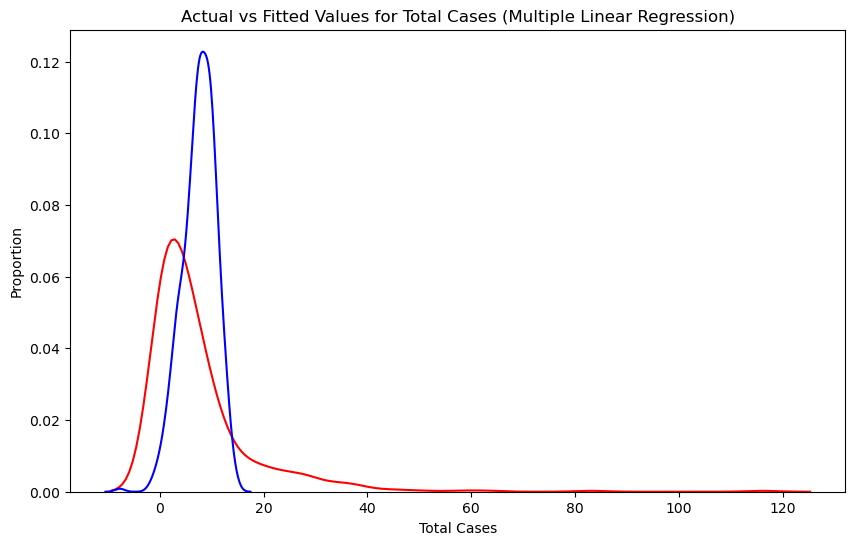

In [55]:
#Let's plot the regression

# Predicting the values
Y_hat = lrm.predict(X)

# Plotting the results
plt.figure(figsize=(10, 6))

ax1 = sns.kdeplot(Y, color="r", label='Actual Value')
sns.kdeplot(Y_hat, color="b", label='Fitted Values', ax=ax1)

plt.title('Actual vs Fitted Values for Total Cases (Multiple Linear Regression)')
plt.xlabel('Total Cases')
plt.ylabel('Proportion')

plt.show()


In [56]:
# Let's look at how good this model is

#R squared
print('R^2: ', lrm.score(X, Y))

# MSE 
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import math

mse = mean_squared_error(scaled_df['total_cases'], Y_hat) #Looking at actual vs predicted total_cases
print('Mean Square Error: ', mse)
print("Root Mean Squared Error: " + str(math.sqrt(mse)))

#MAE
mae = mean_absolute_error(Y, Y_hat)
print(f"Mean Absolute Error: {mae}")


R^2:  0.08848697522310922
Mean Square Error:  105.43712519770973
Root Mean Squared Error: 10.26825813844343
Mean Absolute Error: 6.297203464651825


<h2> Random Forests </h2>

R^2 score: 0.04527637050720601
Mean Squared Error: 83.66886826923077
Root Mean Squared Error: 9.147068834836151
Mean Absolute Error: 6.287403846153847


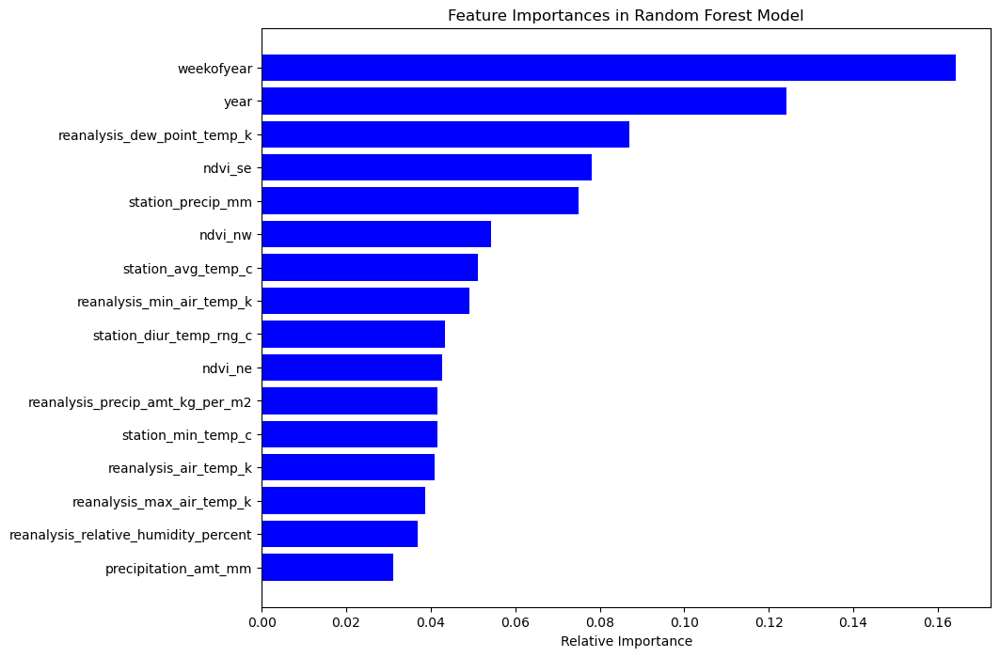

In [57]:
# Okay let's try Random Forest now for Iquitos
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.metrics import r2_score

# Iquitos
iq_df = scaled_df


a = iq_df.drop(['total_cases','city','week_start_date'], axis=1)
b = iq_df['total_cases']
X_train, X_test, y_train, y_test = train_test_split(a, b, test_size=0.2, random_state=42)

rf = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model
rf.fit(X_train, y_train)

# Make predictions
y_pred = rf.predict(X_test)

# Evaluate 
r2 = r2_score(y_test, y_pred)
print(f"R^2 score: {r2}")

mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error: " + str(mse))
print("Root Mean Squared Error: " + str(math.sqrt(mse)))

mae_rf_iq = mean_absolute_error(y_test, y_pred)

print(f"Mean Absolute Error: {mae_rf_iq}")

features = ['year', 'weekofyear','ndvi_ne', 'ndvi_nw', 'ndvi_se', 'precipitation_amt_mm', 
            'reanalysis_air_temp_k', 'reanalysis_min_air_temp_k', 
            'reanalysis_relative_humidity_percent', 'station_diur_temp_rng_c',
            'station_min_temp_c', 'station_precip_mm','reanalysis_dew_point_temp_k', 
            'reanalysis_max_air_temp_k', 'reanalysis_precip_amt_kg_per_m2', 'station_avg_temp_c']

#Feature importances 
features = X_train.columns
importances = rf.feature_importances_

# Sorting the feature importances
indices = np.argsort(importances)

# Creating the plot
plt.figure(figsize=(10, 8))
plt.title('Feature Importances in Random Forest Model')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

<h3> Hyper Parameter Tuning </h3>

Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best parameters: {'max_depth': 10, 'min_samples_leaf': 9, 'min_samples_split': 1, 'n_estimators': 150}


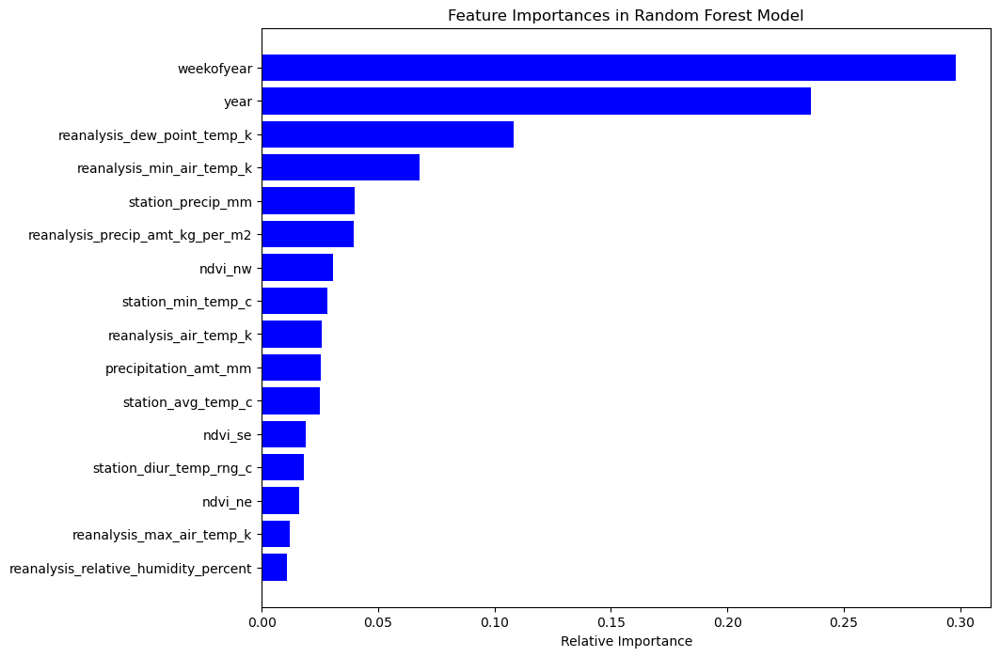

R^2 score: 0.25012242833572473
Mean Squared Error: 65.71682717747424
Root Mean Squared Error: 8.106591588175283
Mean Absolute Error: 5.597944561398923
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.7s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=6, n_estimators=200; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=4, n_estimators=50; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=4, n_estimators=200; total time=   0.6s
[CV] END max_depth=None, m

[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=4, n_estimators=200; total time=   0.6s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=6, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time=   0.7s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=6, n_estimators=50; total time=   0.1s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=6, n_estimat

[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   0.7s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=6, n_estimators=50; total time=   0.1s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=6, n_estimators=50; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=1, min_samples_split=6, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.1s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=   0.2s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=2, n_estimators=100; total time=   0.3s
[CV] END max_depth=None, min_samples_leaf=2, min_samples_split=4, n_estimators

In [58]:
#Let's try tuning the hyper parameters...

param_grid = {
    'n_estimators': [100, 150, 200],  # Number of trees
    'max_depth': [None,5,10],  # Maximum depth of the trees
    'min_samples_split': [1, 2, 4],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [8,9,10]  # Minimum number of samples required to be at a leaf node
}

# Initialize the Random Forest model
rf = RandomForestRegressor(random_state=42)

# Initialize the Grid Search model
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2, scoring='neg_mean_squared_error')

# Fit the Grid Search model
grid_search.fit(X_train, y_train)

# Get the best parameters and the best model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

print(f"Best parameters: {best_params}")

best_model.fit(X_train, y_train)

#Feature importances 
importances = best_model.feature_importances_

# Sorting the feature importances
indices = np.argsort(importances)

# Creating the plot
plt.figure(figsize=(10, 8))
plt.title('Feature Importances in Random Forest Model')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# Making predictions with the best model
y_pred = best_model.predict(X_test)

# Evaluate the model
r2 = r2_score(y_test, y_pred)
print(f"R^2 score: {r2}")


mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")
print(f"Root Mean Squared Error: {math.sqrt(mse)}")


mae_rf_iq = mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error: {mae_rf_iq}")

Let's summarise the models we have so far:

<h3> San Juan </h3>
<h4>MLRM</h4>
R^2:  0.13064567800345284<br>
Mean Square Error:  2292.6828460476454  <br>
Root Mean Squared Error: 47.88196785897218  <br>
Mean Absolute Error: 26.48886967946327  <br>

<h4>Random Forest</h4>
R^2 score: 0.6992027394590535<br>
Mean Squared Error: 790.3970228723406<br>
Root Mean Squared Error: 28.114000477917415<br>
Mean Absolute Error: 13.871968085106385<br>


<h4>Tuned Hyper Parameters</h4>
R^2 score: 0.7061136325334392<br>
Mean Squared Error: 772.2374515332928<br>
Root Mean Squared Error: 27.789160684218096<br>
Mean Absolute Error: 13.790756283516776<br>


<h3>Iquitos</h3>
<h4>MLRM</h4>
R^2:  0.08848697522310922<br>
Mean Square Error:  105.43712519770973<br>
Root Mean Squared Error: 10.26825813844343<br>
Mean Absolute Error: 6.297203464651825<br>

<h4>Random Forest</h4>
R^2 score: 0.04527637050720601<br>
Mean Squared Error: 83.66886826923077<br>
Root Mean Squared Error: 9.147068834836151<br>
Mean Absolute Error: 6.287403846153847<br>

<h4>Tuned Hyper Parameters</h4>
R^2 score: 0.25012242833572473<br>
Mean Squared Error: 65.71682717747424<br>
Root Mean Squared Error: 8.106591588175283<br>
Mean Absolute Error: 5.597944561398923<br>
